##Segmentation binaire, detection et track

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
print(torch.__version__)
print(torch.version.cuda)


2.1.0+cu121
12.1


In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-1d4ugrev
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-1d4ugrev
  Resolved https://github.com/facebookresearch/detectron2.git to commit 864913f0e57e87a75c8cc0c7d79ecbd774fc669b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 636.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 14.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=5739954 sha256=c3bfefe8fb37a00a85c9ac060c

In [ ]:
from PIL import Image
import numpy as np
import os
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import cv2
from skimage import exposure, transform
from tensorflow.keras.models import load_model
from google.colab.patches import cv2_imshow  # Importer cv2_imshow
from scipy import ndimage
import random

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os, json, cv2, random
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

In [ ]:
def load_images_and_masks(base_dir, target_size=(256, 256)):
    images_dir = os.path.join(base_dir, 'images')
    masks_dir = os.path.join(base_dir, 'seg')
    data = []

    for sequence in os.listdir(images_dir):
        sequence_images_dir = os.path.join(images_dir, sequence)
        sequence_masks_dir = os.path.join(masks_dir, sequence)

        for image_file in sorted(os.listdir(sequence_images_dir)):
            if image_file.endswith('.tif') or image_file.endswith('.tiff'):
                image_number = image_file.split('t')[1].split('.')[0]
                mask_file = f"man_seg{image_number}.tif"

                image_path = os.path.join(sequence_images_dir, image_file)
                mask_path = os.path.join(sequence_masks_dir, mask_file)

                if os.path.exists(mask_path):
                    image = Image.open(image_path).convert('L')
                    mask = Image.open(mask_path).convert('L')

                    image = np.array(image) / 255.0
                    mask = np.array(mask) / 255.0

                    image = exposure.equalize_adapthist(image)

                    image_resized = resize(image, target_size, anti_aliasing=True)
                    mask_resized = resize(mask, target_size, anti_aliasing=True)

                    mask_resized = (mask_resized > 0).astype(np.float32)

                    image_with_channel = np.expand_dims(image_resized, axis=-1)
                    mask_with_channel = np.expand_dims(mask_resized, axis=-1)

                    data.append((image_with_channel, mask_with_channel))
                else:
                    print(f"Mask not found for {image_path}")

    return data

dataset_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data'
dataset = load_images_and_masks(dataset_path)

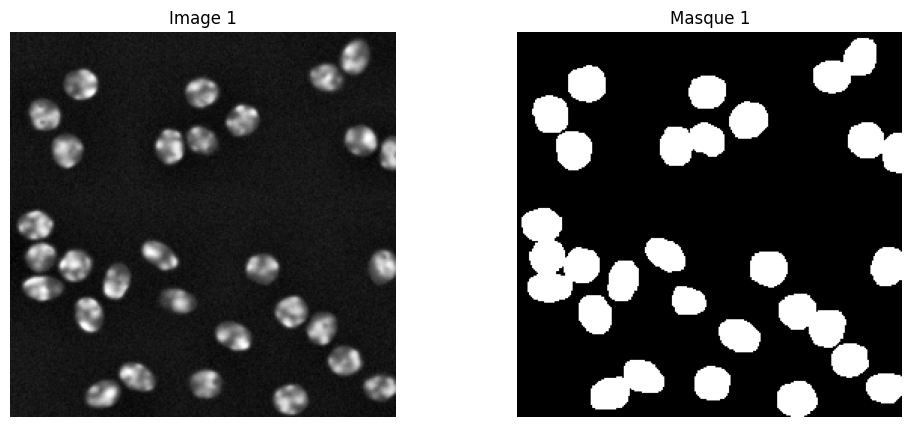

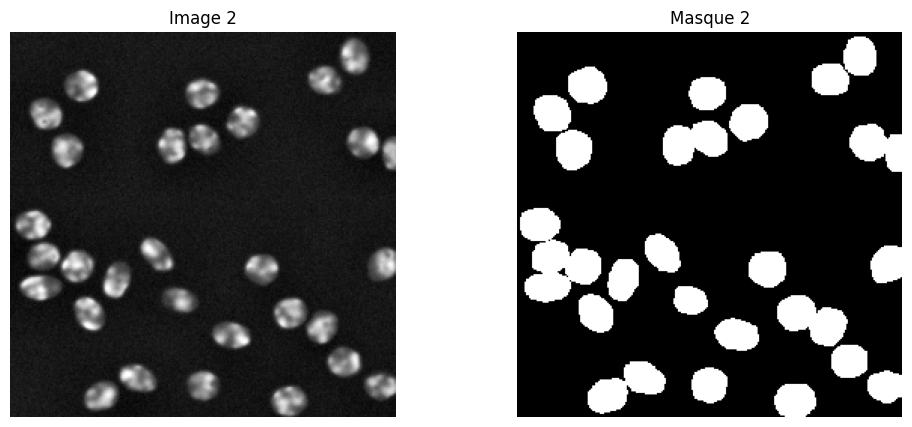

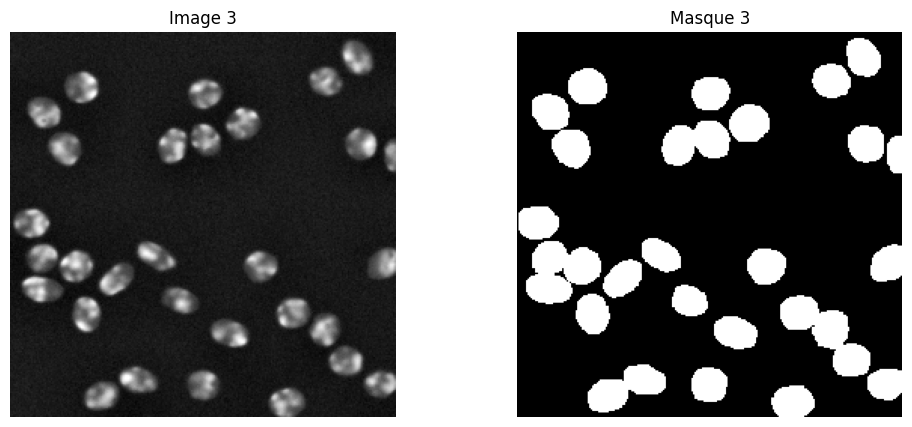

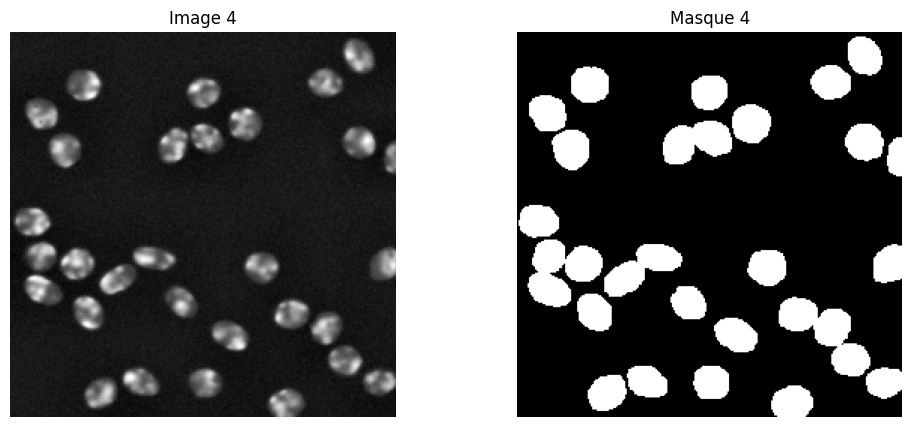

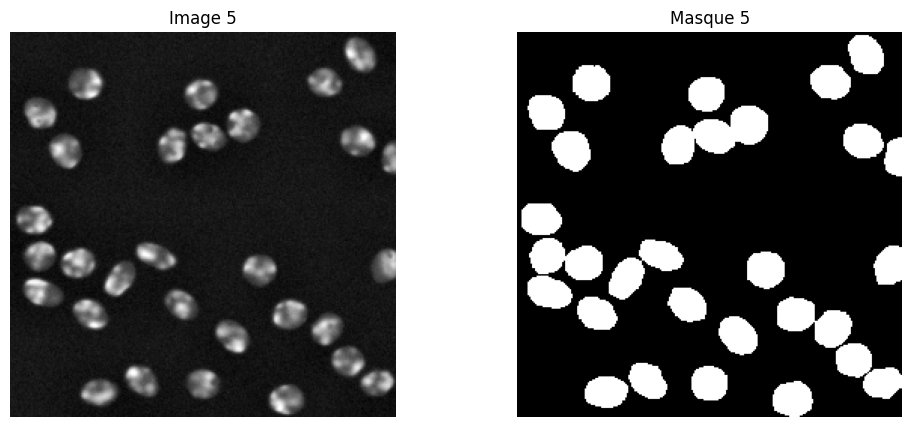

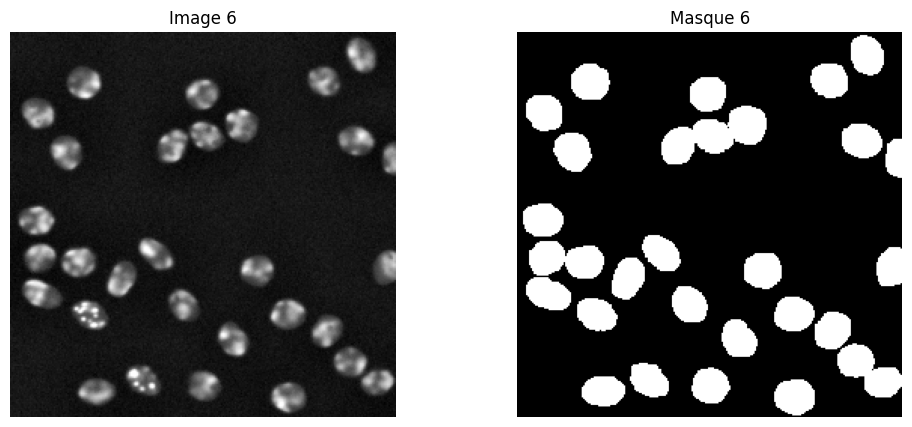

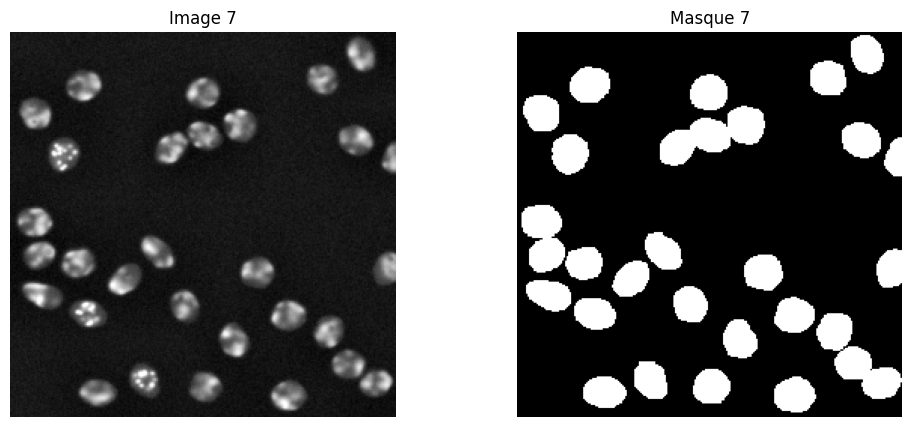

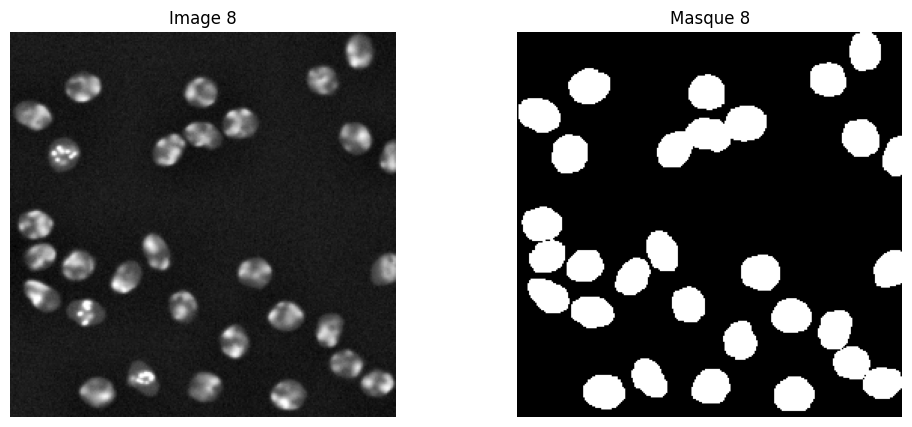

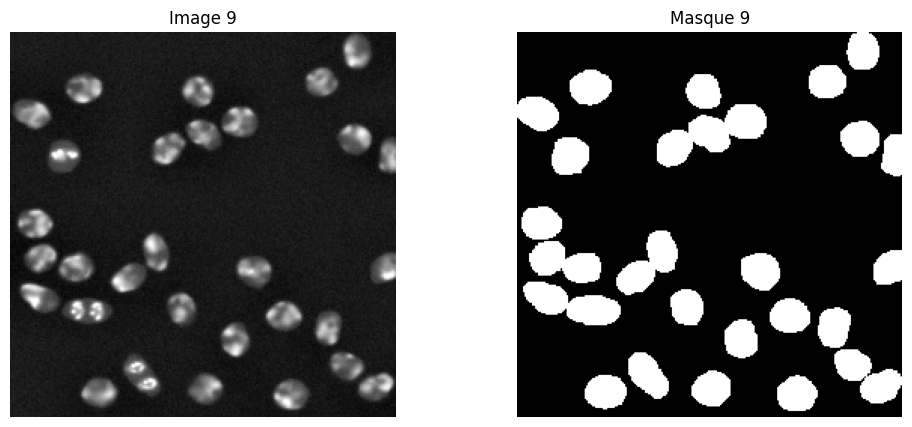

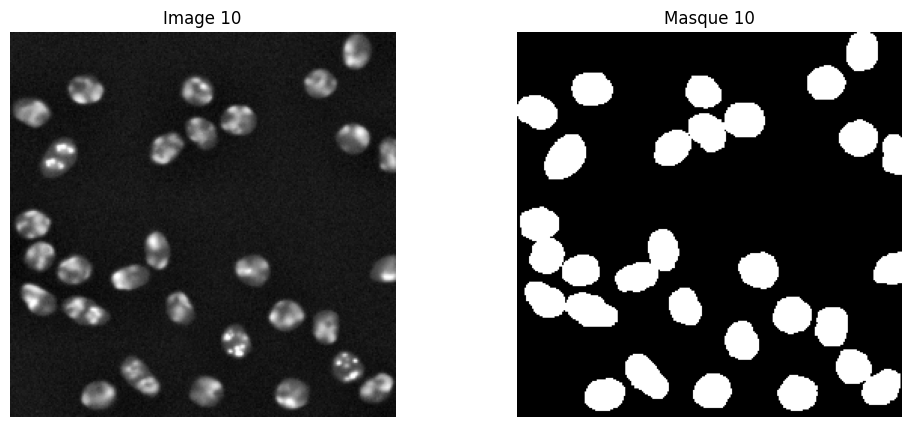

In [ ]:
def display_image_mask_pairs(dataset, num_pairs=10):
    for i, (image, mask) in enumerate(dataset[:num_pairs]):
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Image {i+1}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Masque {i+1}')
        plt.axis('off')

        plt.show()

display_image_mask_pairs(dataset)

In [ ]:
print(len(dataset))

215


In [ ]:
images, masks = zip(*dataset)

train_images, test_images, train_masks, test_masks = train_test_split(
    images, masks, test_size=0.2, random_state=42)

train_images, val_images, train_masks, val_masks = train_test_split(
    train_images, train_masks, test_size=0.25, random_state=42)

train_images = np.stack(train_images, axis=0)
train_masks = np.stack(train_masks, axis=0)

val_images = np.stack(val_images, axis=0)
val_masks = np.stack(val_masks, axis=0)

test_images = np.stack(test_images, axis=0)
test_masks = np.stack(test_masks, axis=0)

In [ ]:
print(len(train_images))

129


In [ ]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import MeanIoU, Recall, Precision
def unet_model(input_size=(256, 256, 1)):
    inputs = layers.Input(input_size)

    # Couches de contraction (encodeur)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Couches de fond (bottleneck)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

    # Couches d'expansion (décodeur)
    u4 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c3)
    u4 = layers.concatenate([u4, c2])
    c4 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u4)
    c4 = layers.Dropout(0.1)(c4)
    c4 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

    u5 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c4)
    u5 = layers.concatenate([u5, c1], axis=3)
    c5 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u5)
    c5 = layers.Dropout(0.1)(c5)
    c5 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Sortie
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c5)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_augmented_data_generator(x_train, y_train, batch_size):
    # Créer un générateur d'augmentation qui inclut plusieurs transformations
    data_gen_args = dict(
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.05,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Générateur d'images augmentées pour les images d'entraînement
    image_datagen = ImageDataGenerator(**data_gen_args)
    # Générateur d'images augmentées pour les masques d'entraînement
    mask_datagen = ImageDataGenerator(**data_gen_args)

    # Fournir les mêmes nombres aléatoires aux générateurs d'images et de masques pour s'assurer que les transformations correspondent
    seed = 1
    image_datagen.fit(x_train, augment=True, seed=seed)
    mask_datagen.fit(y_train, augment=True, seed=seed)

    # Créer les générateurs d'augmentation réels
    image_generator = image_datagen.flow(x_train, batch_size=batch_size, seed=seed)
    mask_generator = mask_datagen.flow(y_train, batch_size=batch_size, seed=seed)
    # Combiner les générateurs en un seul, qui donne un tuple d'images et de masques
    train_generator = zip(image_generator, mask_generator)

    return train_generator


In [ ]:
model = unet_model()
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy', MeanIoU(num_classes=2), Recall(), Precision()])
batch_size=32
print(train_images.shape)
print(train_masks.shape)

print(val_images.shape)
print(val_masks.shape)

print(test_images.shape)
print(test_masks.shape)

(129, 256, 256, 1)
(129, 256, 256, 1)
(43, 256, 256, 1)
(43, 256, 256, 1)
(43, 256, 256, 1)
(43, 256, 256, 1)


## Entrainement avec augmentation de données

In [ ]:
train_generator = create_augmented_data_generator(train_images, train_masks, batch_size)

history = model.fit(
    train_generator,
    steps_per_epoch=len(train_images) // batch_size,
    epochs=50,
    validation_data=(val_images, val_masks)
)

Epoch 1/50
4/4 [==============================] - 73s 5s/step - loss: 0.5952 - accuracy: 0.7994 - mean_io_u: 0.4389 - recall: 0.0754 - precision: 0.1666 - val_loss: 0.5772 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 2/50
4/4 [==============================] - 8s 1s/step - loss: 0.5762 - accuracy: 0.8470 - mean_io_u: 0.4386 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 0.5662 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 3/50
4/4 [==============================] - 5s 1s/step - loss: 0.5543 - accuracy: 0.8481 - mean_io_u: 0.4390 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 0.5735 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 4/50
4/4 [==============================] - 5s 1s/step - loss: 0.5566 - accuracy: 0.8469 - mean_io_u: 0.4386 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss

In [ ]:
model.save('/content/drive/MyDrive/Master 2/BioMedical/Data_augmented_modele_unet.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Entrainement sans augmentation de données

In [ ]:
history = model.fit(
    x=train_images,
    y=train_masks,
    batch_size=32,
    epochs=50,
    validation_data=(val_images, val_masks)
)

model.save('/content/drive/MyDrive/Master 2/BioMedical/modele_unet.h5')

Epoch 1/50
5/5 [==============================] - 40s 3s/step - loss: 0.6911 - accuracy: 0.7186 - mean_io_u: 0.4297 - recall: 0.1772 - precision: 0.1306 - val_loss: 0.6110 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 2/50
5/5 [==============================] - 6s 1s/step - loss: 0.5838 - accuracy: 0.8595 - mean_io_u: 0.4297 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 0.5951 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 3/50
5/5 [==============================] - 6s 1s/step - loss: 0.5569 - accuracy: 0.8595 - mean_io_u: 0.4297 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 0.5519 - val_accuracy: 0.8472 - val_mean_io_u: 0.4236 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 4/50
5/5 [==============================] - 6s 1s/step - loss: 0.5053 - accuracy: 0.8596 - mean_io_u: 0.4297 - recall: 0.0012 - precision: 0.9800 - val_loss: 0.4426

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


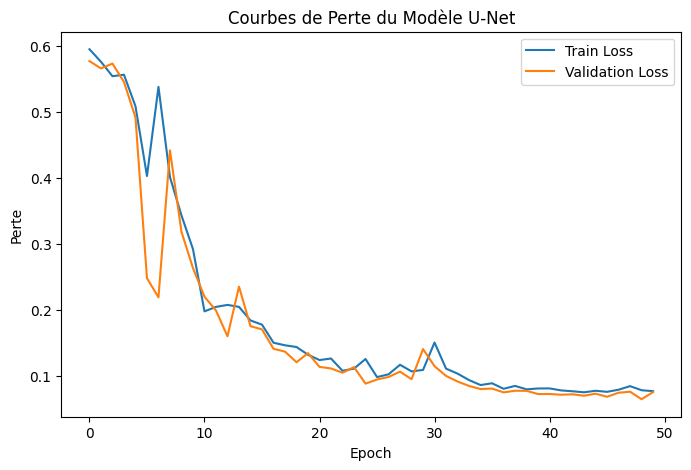

In [ ]:
import matplotlib.pyplot as plt

# Tracer les courbes de perte d'entraînement et de validation
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Courbes de Perte du Modèle U-Net')
plt.ylabel('Perte')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()
from numba import cuda
cuda.select_device(0)
cuda.close()


In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score
predicted_masks = model.predict(test_images)
def calculate_metrics(true_masks, pred_masks, threshold=0.3):
    # Aplatir les tableaux de masques
    true_masks_flat = true_masks.flatten()
    pred_masks_flat = pred_masks.flatten()

    # Binariser les prédictions
    pred_masks_flat = np.where(pred_masks_flat > threshold, 1, 0)

    # Calculer les métriques
    accuracy = accuracy_score(true_masks_flat, pred_masks_flat)
    precision = precision_score(true_masks_flat, pred_masks_flat)
    recall = recall_score(true_masks_flat, pred_masks_flat)
    iou = jaccard_score(true_masks_flat, pred_masks_flat)

    return accuracy, precision, recall, iou

# Utilisation de la fonction pour calculer les métriques
accuracy, precision, recall, iou = calculate_metrics(test_masks, predicted_masks)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"IoU: {iou:.4f}")


2/2 [==============================] - 0s 318ms/step
Accuracy: 0.9723
Precision: 0.9132
Recall: 0.8549
IoU: 0.7906


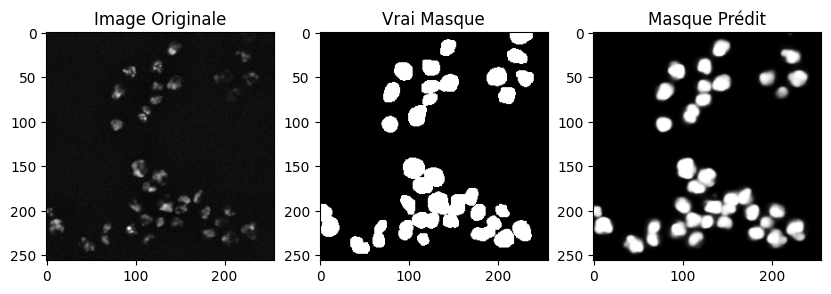

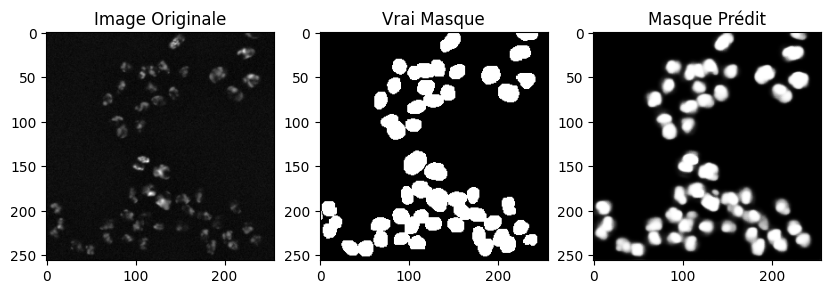

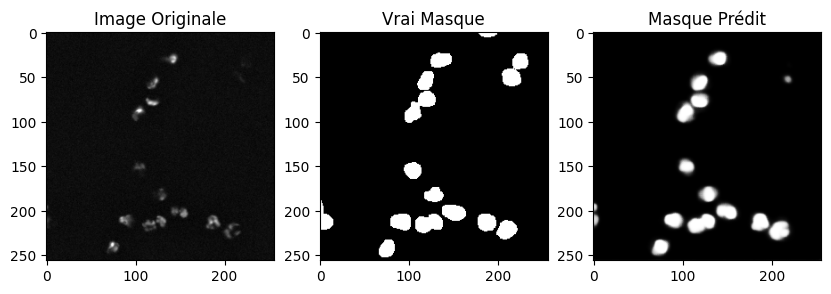

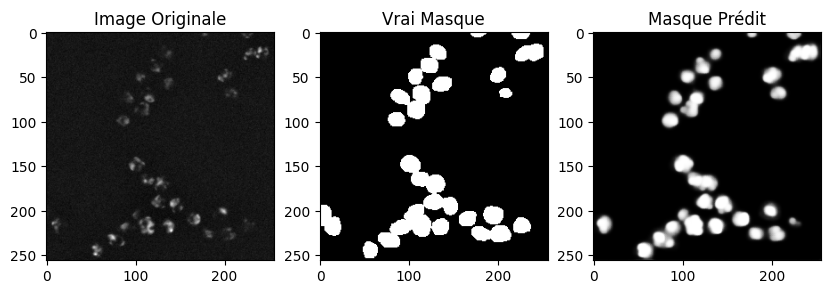

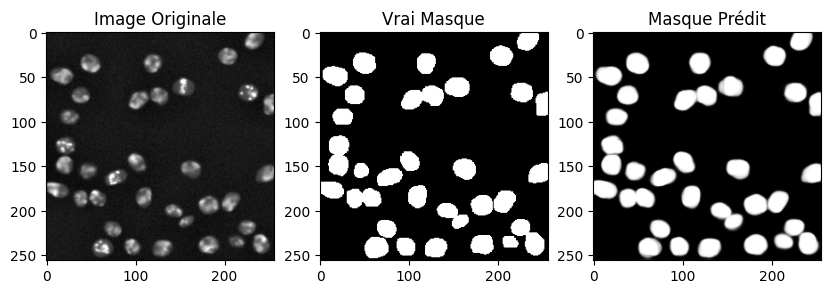

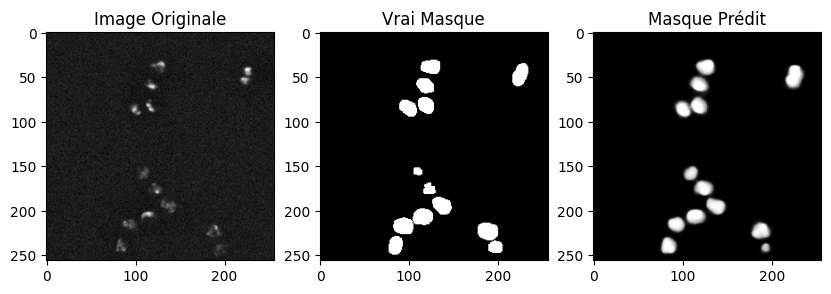

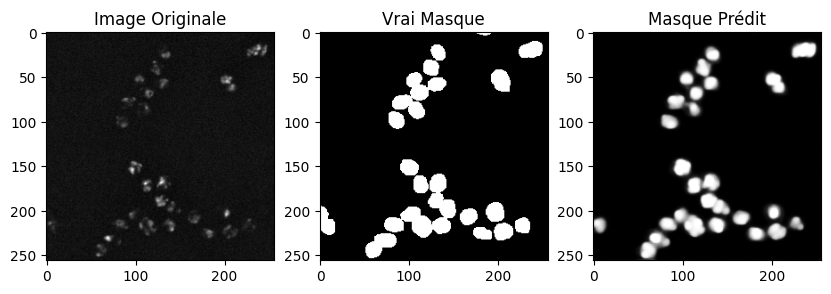

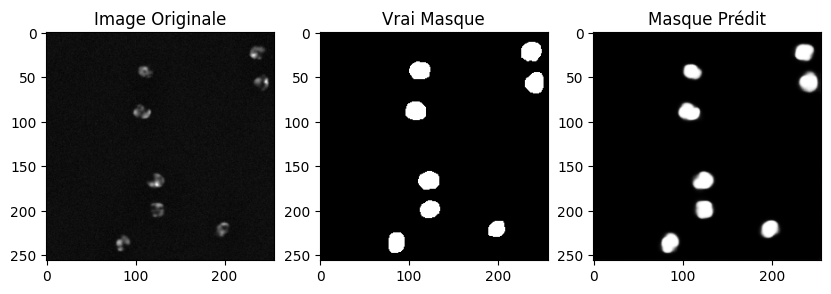

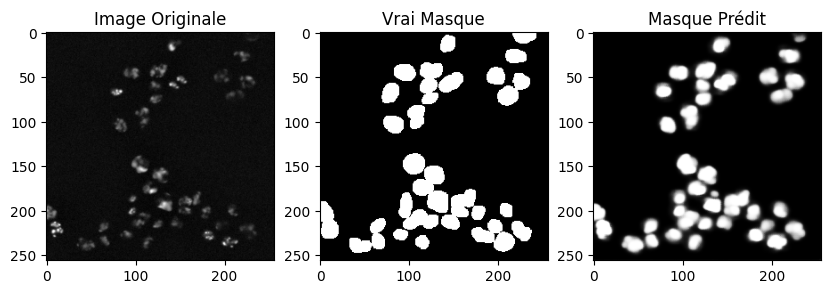

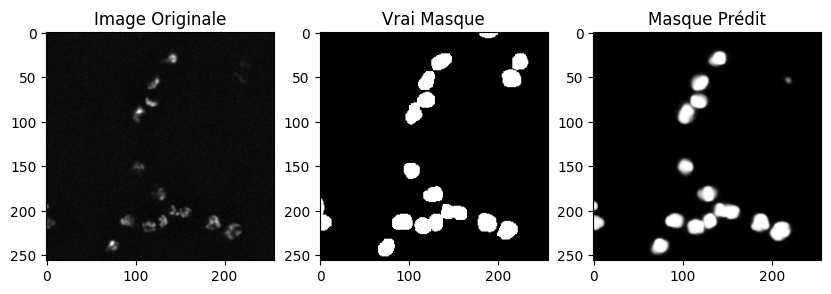

In [ ]:
import matplotlib.pyplot as plt


# Afficher les résultats pour quelques images
num_samples = 10  # Choisissez le nombre d'échantillons que vous souhaitez visualiser
for i in range(num_samples):
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(test_images[i].squeeze(), cmap='gray')
    plt.title("Image Originale")

    plt.subplot(1, 3, 2)
    plt.imshow(test_masks[i].squeeze(), cmap='gray')
    plt.title("Vrai Masque")

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
    plt.title("Masque Prédit")

    plt.show()


#Detection and tracking

In [ ]:
unet_model = load_model('/content/drive/MyDrive/Master 2/BioMedical/Data_augmented_modele_unet.h5')

In [ ]:
def load_images_only(base_dir, target_size=(256, 256)):
    images_dir = os.path.join(base_dir, 'images')
    images = []

    for sequence in os.listdir(images_dir):
        sequence_images_dir = os.path.join(images_dir, sequence)

        for image_file in sorted(os.listdir(sequence_images_dir)):
            if image_file.endswith('.tif') or image_file.endswith('.tiff'):
                image_path = os.path.join(sequence_images_dir, image_file)
                image = Image.open(image_path).convert('L')
                image = np.array(image) / 255.0
                image = exposure.equalize_adapthist(image)
                image_resized = transform.resize(image, target_size, anti_aliasing=True)
                images.append(image_resized)

    return images

def segment_image(model, image):
    preprocessed = np.expand_dims(image, axis=0)
    mask = model.predict(preprocessed)
    return mask[0, :, :, 0]

def extract_bounding_boxes(mask):
    kernel = np.ones((3,3), np.uint8)
    dilated_mask = cv2.dilate(mask, kernel, iterations=1)
    eroded_mask = cv2.erode(dilated_mask, kernel, iterations=1)

    contours, _ = cv2.findContours(eroded_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return [cv2.boundingRect(contour) for contour in contours]

dataset_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data'
images = load_images_only(dataset_path)

In [ ]:

for image in images:
    segmented_mask = segment_image(unet_model, image)
    binary_mask = (segmented_mask > 0.8).astype(np.uint8)

    mask_bgr = cv2.cvtColor(binary_mask * 255, cv2.COLOR_GRAY2BGR)

    boxes = extract_bounding_boxes(binary_mask)

    image_bgr = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    for (x, y, w, h) in boxes:
        cv2.rectangle(image_bgr, (x, y), (x + w, y + h), (0, 255, 0), 2)

    composite_image = np.concatenate((image_bgr, mask_bgr), axis=1)

    cv2_imshow(composite_image)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

In [ ]:
import os
import logging
from PIL import Image
import numpy as np
from skimage import transform, exposure
import cv2
from scipy import ndimage
def load_images_only(images_dir: str, target_size: tuple = (256, 256)) -> list:
    print("images_dir ",images_dir)
    images = []
    if not os.path.exists(images_dir):
        logging.error(f"Directory not found: {images_dir}")
        return images

    for image_file in sorted(os.listdir(images_dir)):
            if image_file.lower().endswith(('.tif', '.tiff')):
                image_path = os.path.join(images_dir, image_file)
                print(image_path)
                try:
                    image = Image.open(image_path).convert('L')
                    image = np.array(image) / 255.0
                    image = exposure.equalize_adapthist(image)
                    image_resized = transform.resize(image, target_size, anti_aliasing=True)
                    images.append(image_resized)
                except IOError:
                    logging.error(f"Failed to process image: {image_path}")
    return images

def segment_image(model, image):
    preprocessed = np.expand_dims(image, axis=0)
    mask = model.predict(preprocessed)
    return mask[0, :, :, 0]

def apply_watershed(binary_mask, thresh=0.57):
    distance_transform = ndimage.distance_transform_edt(binary_mask)
    sure_fg = cv2.threshold(distance_transform, thresh*distance_transform.max(), 255, 0)[1].astype(np.uint8)
    sure_bg = cv2.dilate(binary_mask, np.ones((3,3), np.uint8), iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(cv2.cvtColor(binary_mask * 255, cv2.COLOR_GRAY2BGR), markers)
    return markers

def extract_bounding_boxes_watershed(markers):
    boxes = []
    label_id = 1  # Identifiant pour chaque cellule
    for label in np.unique(markers):
        if label <= 1:
            continue
        mask = np.zeros(markers.shape, dtype=np.uint8)
        mask[markers == label] = 255
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        x, y, w, h = cv2.boundingRect(contours[0])
        boxes.append((x, y, w, h, label_id))
        label_id += 1
    return boxes

def track_cells(old_boxes, new_boxes, max_distance=20):
    if not old_boxes:
        return [(x, y, w, h, idx+1) for idx, (x, y, w, h, _) in enumerate(new_boxes)]

    old_centers = [(x + w//2, y + h//2, id) for x, y, w, h, id in old_boxes]
    new_centers = [(x + w//2, y + h//2) for x, y, w, h, _ in new_boxes]
    new_boxes_with_id = []

    for new_center, new_box in zip(new_centers, new_boxes):
        x, y, w, h, _ = new_box
        distances = [((new_center[0] - old_center[0])**2 + (new_center[1] - old_center[1])**2, old_center[2]) for old_center in old_centers]
        distances.sort(key=lambda x: x[0])
        if distances and distances[0][0] < max_distance**2:
            matched_id = distances[0][1]
        else:
            matched_id = max([id for _, _, id in old_centers], default=0) + 1
        new_boxes_with_id.append((x, y, w, h, matched_id))

    return new_boxes_with_id
def id_to_color(id):
    """Génère une couleur unique pour un identifiant donné tout en évitant les couleurs sombres."""
    random.seed(id)
    r = random.randint(100, 255)
    g = random.randint(100, 255)
    b = random.randint(100, 255)
    while abs(r - g) < 30 and abs(g - b) < 30 and abs(r - b) < 30:
        g = random.randint(100, 255)
        b = random.randint(100, 255)
    return (r, g, b)

def process_sequence(sequence_dir, model, save_dir):
    images = load_images_only(sequence_dir)
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        print("Created directory for saving images:", save_dir)

    previous_boxes = []

    for idx, image in enumerate(images):
        segmented_mask = segment_image(model, image)
        binary_mask = (segmented_mask > 0.3).astype(np.uint8)
        mask_bgr = cv2.cvtColor(binary_mask * 255, cv2.COLOR_GRAY2BGR)
        markers = apply_watershed(binary_mask)
        boxes = extract_bounding_boxes_watershed(markers)
        boxes_with_id = track_cells(previous_boxes, boxes)
        previous_boxes = boxes_with_id

        image_bgr = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
        for (x, y, w, h, label_id) in boxes_with_id:
            color = id_to_color(label_id)
            marge_pct = 0.25
            marge_x = int(w * marge_pct)
            marge_y = int(h * marge_pct)
            cv2.rectangle(image_bgr,
              (max(int(x) - marge_x, 0), max(int(y) - marge_y, 0)),
              (min(int(x + w) + marge_x, image_bgr.shape[1]), min(int(y + h) + marge_y, image_bgr.shape[0])),
              color, 2)
            # cv2.putText(image_bgr, str(label_id), (int(x), int(y) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

        save_path = os.path.join(save_dir, f"processed_image_{idx}.png")
        success = cv2.imwrite(save_path, image_bgr)
        if success:
            print(f"Image saved successfully at {save_path}")
        else:
            print(f"Failed to save image at {save_path}")

        composite_image = np.concatenate((image_bgr, mask_bgr), axis=1)
        cv2_imshow(composite_image)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cv2.destroyAllWindows()


In [ ]:
dataset_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data'
images = load_images_only(dataset_path)

images_dir  /content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data


In [ ]:

dataset_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data'
save_root_dir = '/content/drive/MyDrive/Master 2/BioMedical/result'


for sequence in sorted(os.listdir(os.path.join(dataset_path, 'images'))):
    save_dir = os.path.join(save_root_dir, sequence)
    sequence_dir = os.path.join(dataset_path,"images", sequence)
    process_sequence(sequence_dir, unet_model,save_dir)

In [ ]:
import cv2
import os

def create_video_from_images(image_folder, video_path, fps=30):
    images = [img for img in sorted(os.listdir(image_folder)) if img.endswith(".png")]
    print(len(images))
    if not images:
        print("Aucune image trouvée dans le dossier.")
        return

    frame = cv2.imread(os.path.join(image_folder, images[0]))
    if frame is None:
        print("Impossible de lire la première image.")
        return

    height, width, layers = frame.shape
    video = cv2.VideoWriter(video_path, cv2.VideoWriter_fourcc(*'XVID'), fps, (width, height))

    for image in images:
        img_path = os.path.join(image_folder, image)
        frame = cv2.imread(img_path)
        if frame is not None:
            video.write(frame)
        else:
            print(f"Impossible de lire l'image {img_path}")

    video.release()
    print(f"Vidéo enregistrée sous : {video_path}")




In [ ]:
image_folder_sequence2 = "/content/drive/MyDrive/Master 2/BioMedical/result/sequence1"
video_path_sequence2 = '/content/drive/MyDrive/Master 2/BioMedical/result/output_sequence1.mp4'
create_video_from_images(image_folder_sequence2, video_path_sequence2, fps=15)

image_folder_sequence1 = '/content/drive/MyDrive/Master 2/BioMedical/result/sequence2'
video_path_sequence1 = '/content/drive/MyDrive/Master 2/BioMedical/result/output_sequence2.mp4'
create_video_from_images(image_folder_sequence1, video_path_sequence1, fps=15)

65
Vidéo enregistrée sous : /content/drive/MyDrive/Master 2/BioMedical/result/output_sequence1.mp4
150
Vidéo enregistrée sous : /content/drive/MyDrive/Master 2/BioMedical/result/output_sequence2.mp4


Processing sequence: /content/drive/MyDrive/Master 2/BioMedical/Test/02
images_dir  /content/drive/MyDrive/Master 2/BioMedical/Test/02
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t000.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t001.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t002.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t003.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t004.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t005.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t006.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t007.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t008.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t009.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t010.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t011.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t012.tif
/content/drive/MyDrive/Master 2/BioMedical/Test/02/t013.tif
/content/drive/MyDrive/Ma

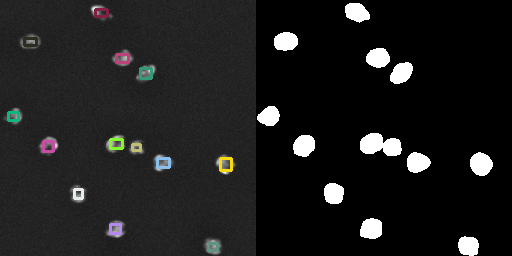

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_1.png


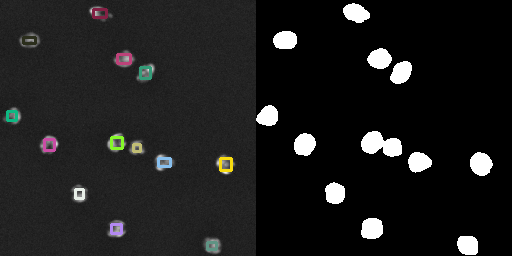

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_2.png


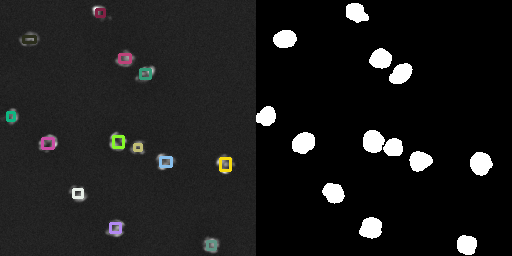

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_3.png


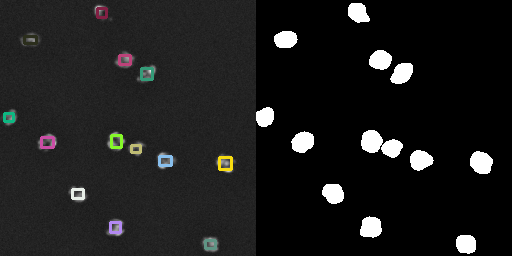

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_4.png


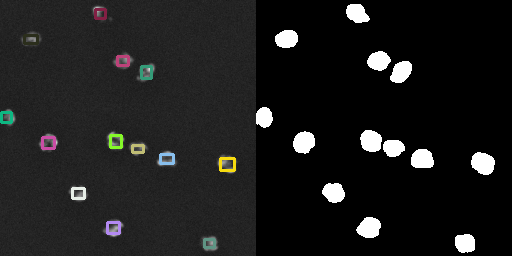

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_5.png


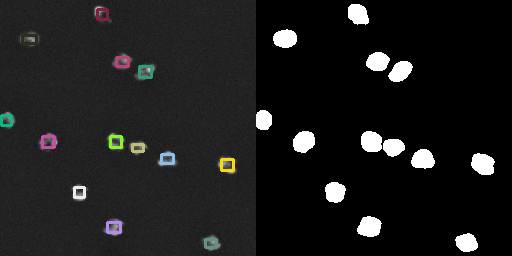

1/1 [==============================] - 0s 18ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_6.png


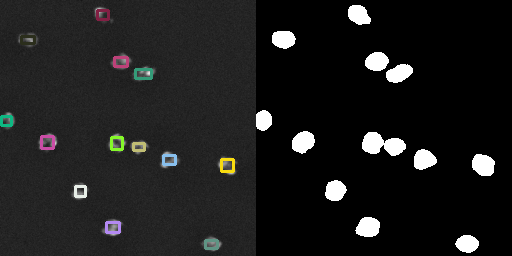

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_7.png


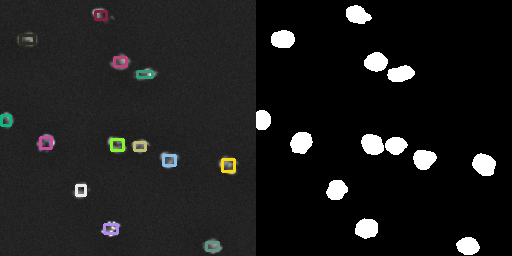

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_8.png


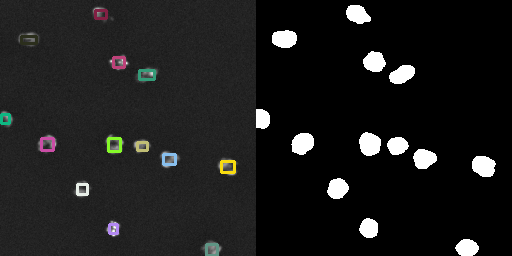

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_9.png


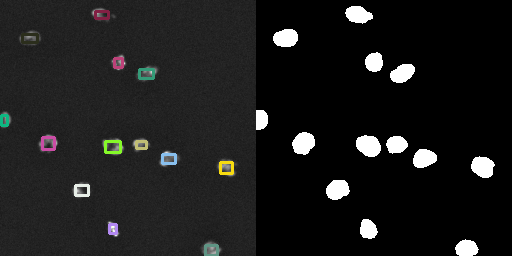

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_10.png


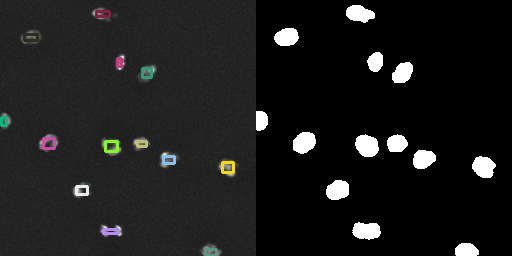

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_11.png


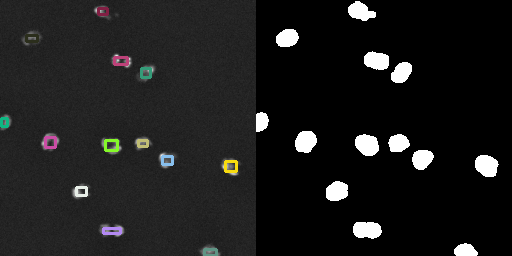

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_12.png


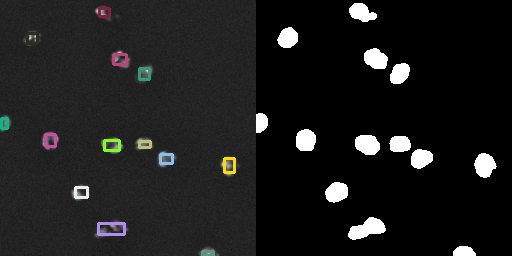

1/1 [==============================] - 0s 18ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_13.png


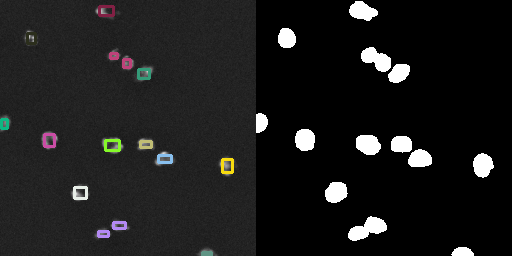

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_14.png


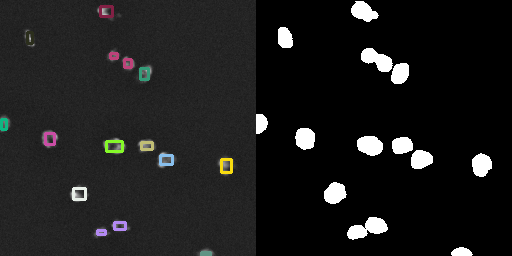

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_15.png


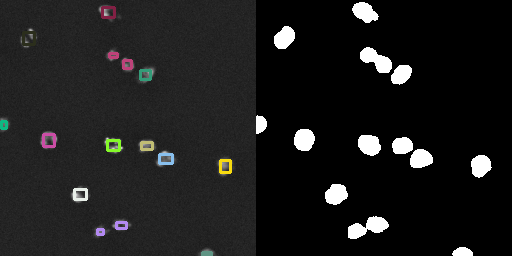

1/1 [==============================] - 0s 23ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_16.png


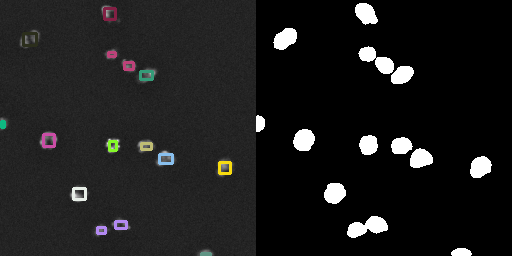

1/1 [==============================] - 0s 22ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_17.png


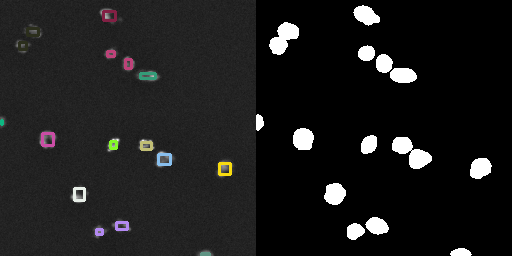

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_18.png


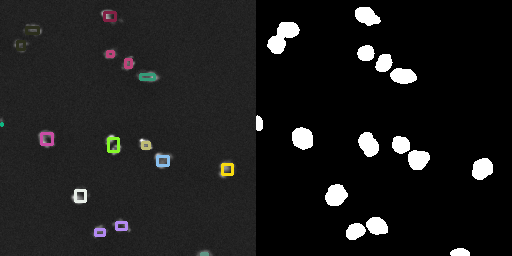

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_19.png


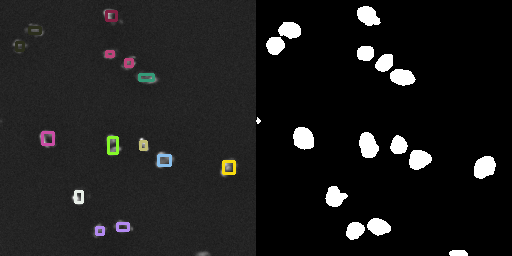

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_20.png


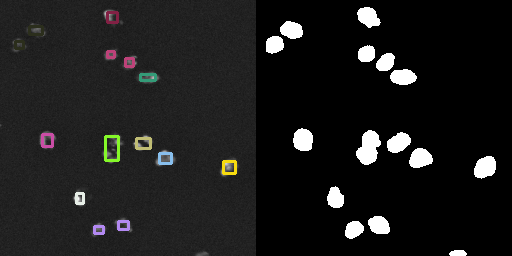

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_21.png


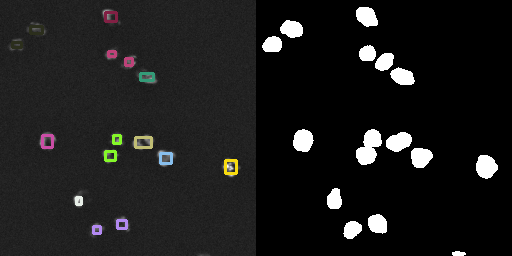

1/1 [==============================] - 0s 20ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_22.png


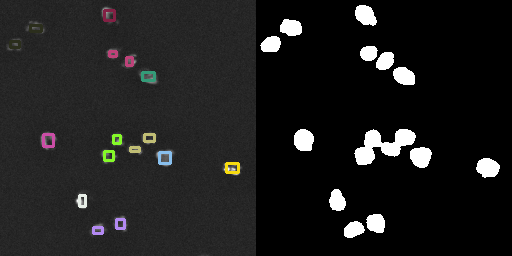

1/1 [==============================] - 0s 21ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_23.png


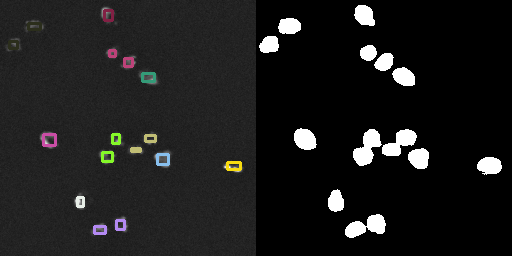

1/1 [==============================] - 0s 21ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_24.png


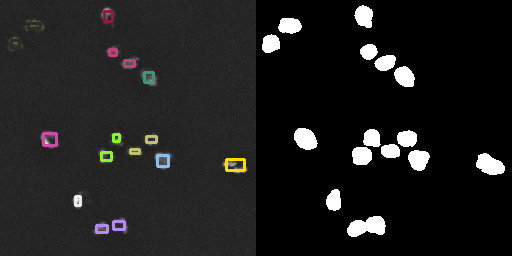

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_25.png


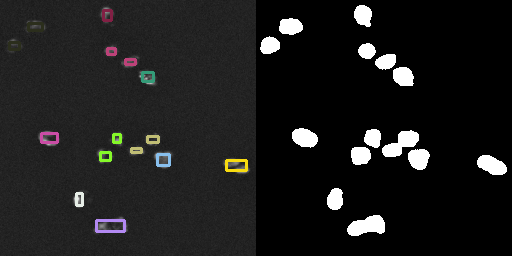

1/1 [==============================] - 0s 21ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_26.png


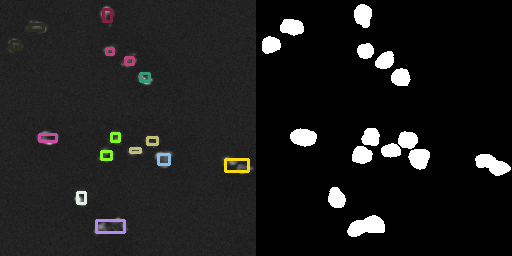

1/1 [==============================] - 0s 19ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_27.png


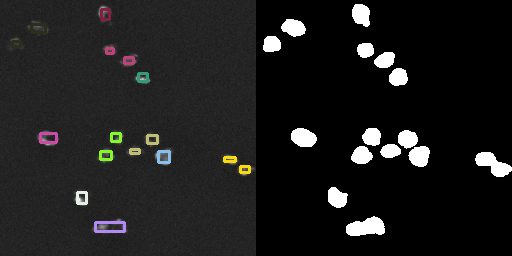

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_28.png


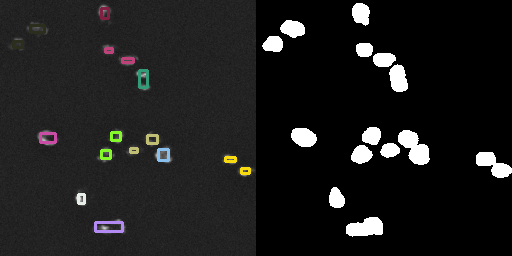

1/1 [==============================] - 0s 24ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_29.png


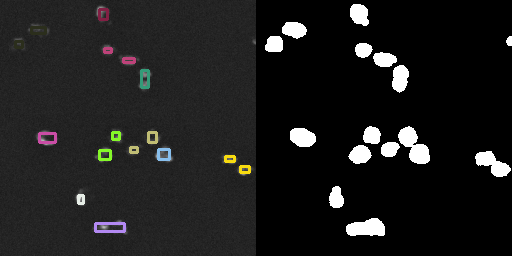

1/1 [==============================] - 0s 33ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_30.png


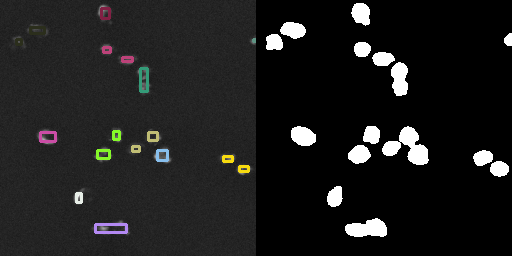

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_31.png


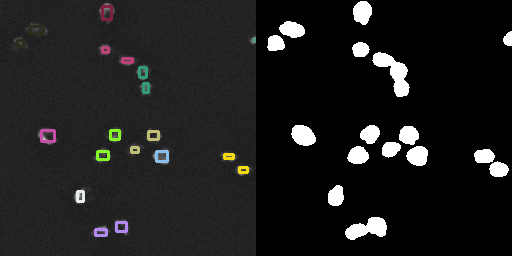

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_32.png


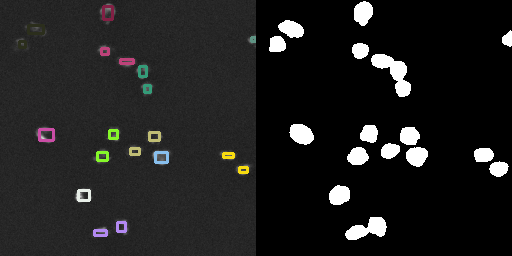

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_33.png


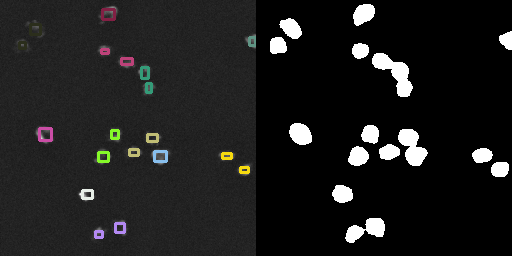

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_34.png


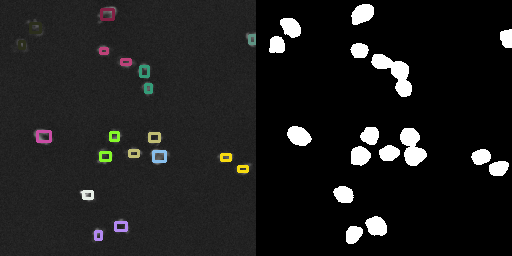

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_35.png


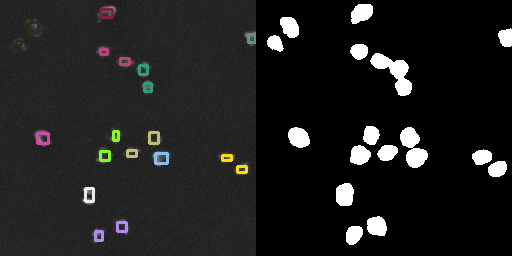

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_36.png


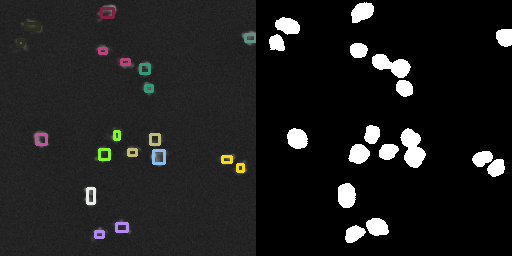

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_37.png


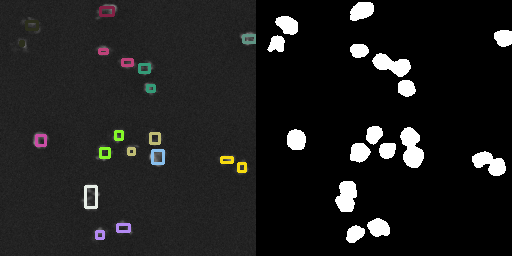

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_38.png


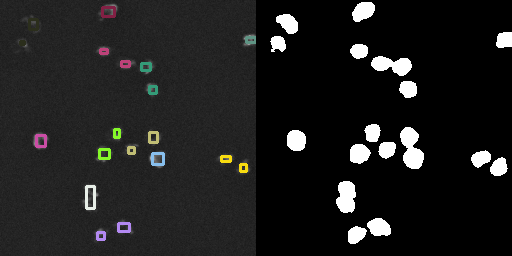

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_39.png


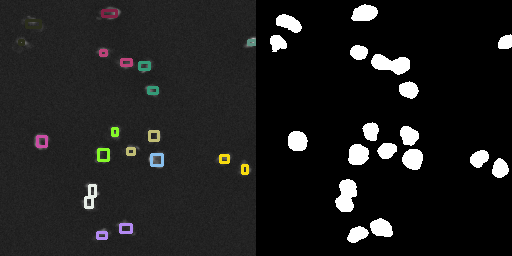

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_40.png


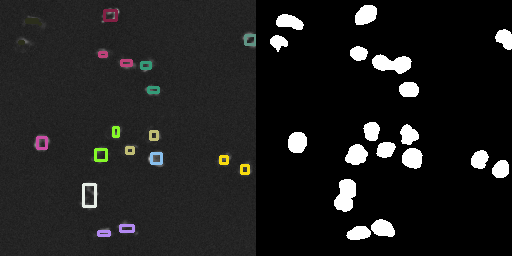

1/1 [==============================] - 0s 30ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_41.png


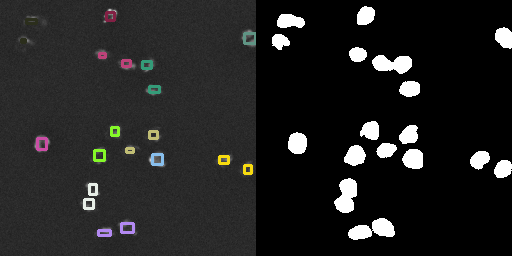

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_42.png


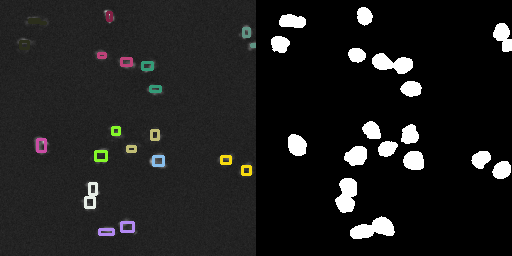

1/1 [==============================] - 0s 58ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_43.png


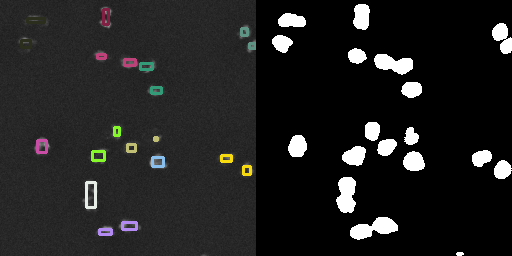

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_44.png


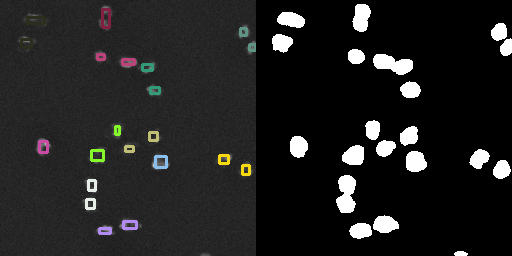

1/1 [==============================] - 0s 49ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_45.png


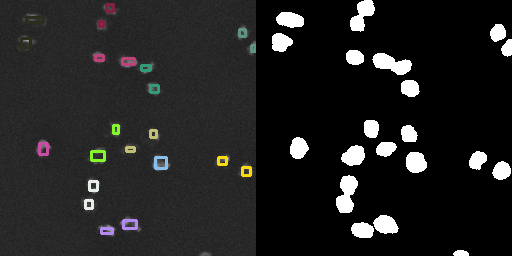

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_46.png


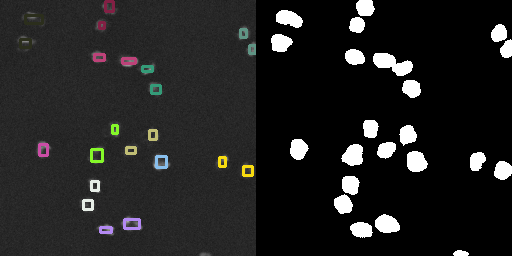

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_47.png


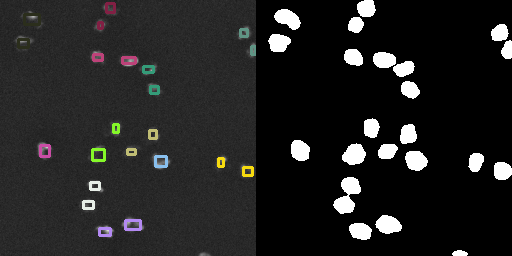

1/1 [==============================] - 0s 40ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_48.png


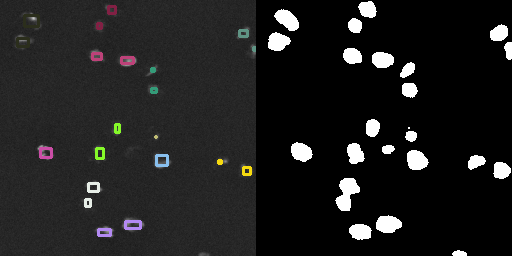

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_49.png


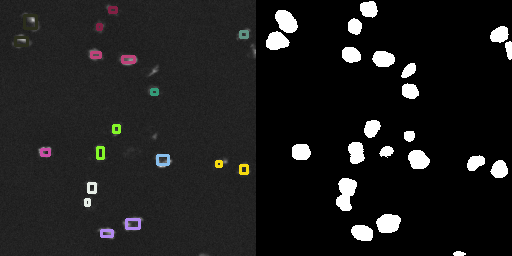

1/1 [==============================] - 0s 33ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_50.png


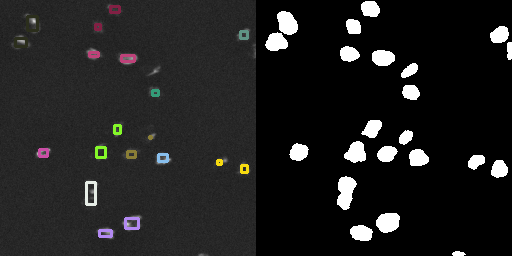

1/1 [==============================] - 0s 38ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_51.png


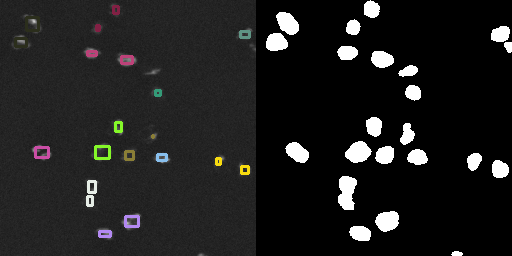

1/1 [==============================] - 0s 33ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_52.png


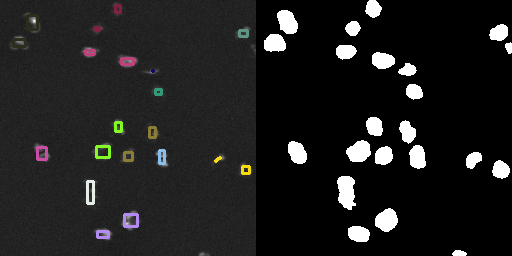

1/1 [==============================] - 0s 45ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_53.png


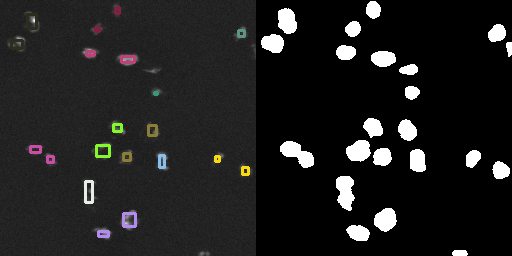

1/1 [==============================] - 0s 34ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_54.png


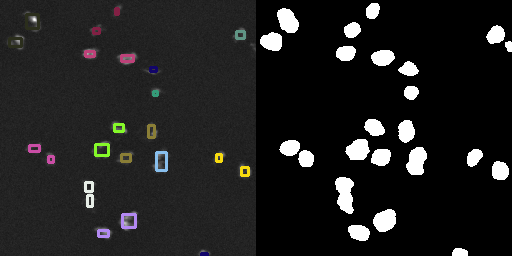

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_55.png


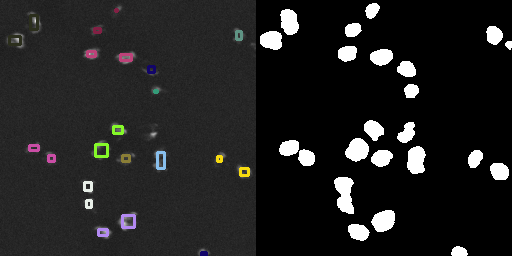

1/1 [==============================] - 0s 37ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_56.png


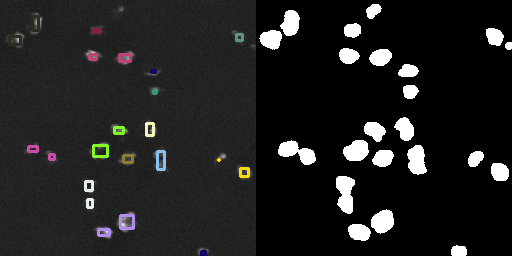

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_57.png


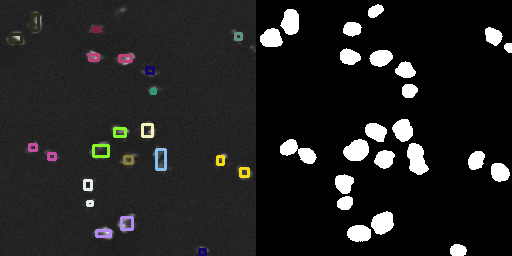

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_58.png


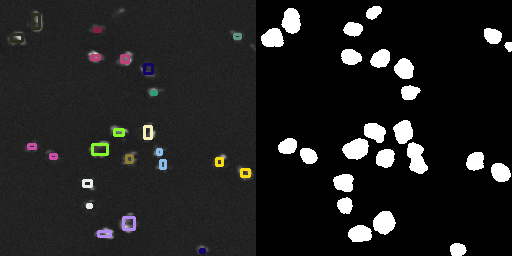

1/1 [==============================] - 0s 39ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_59.png


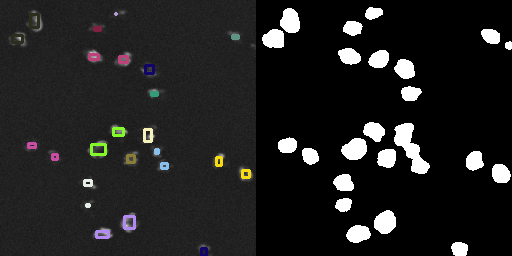

1/1 [==============================] - 0s 57ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_60.png


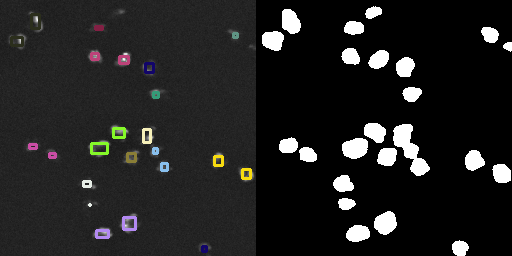

1/1 [==============================] - 0s 38ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_61.png


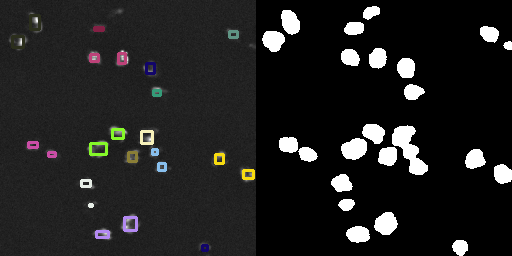

1/1 [==============================] - 0s 43ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_62.png


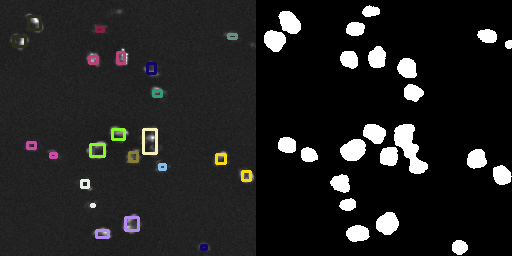

1/1 [==============================] - 0s 35ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_63.png


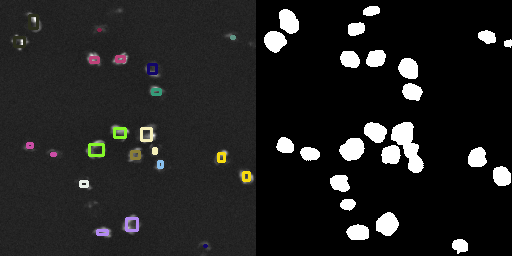

1/1 [==============================] - 0s 30ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_64.png


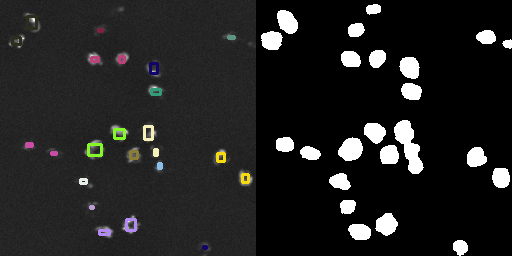

1/1 [==============================] - 0s 30ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_65.png


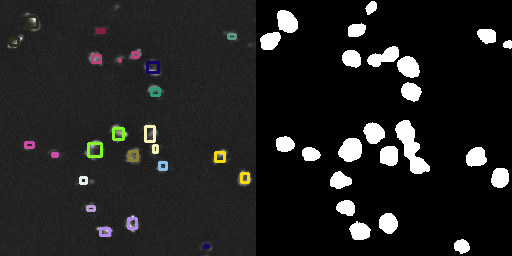

1/1 [==============================] - 0s 30ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_66.png


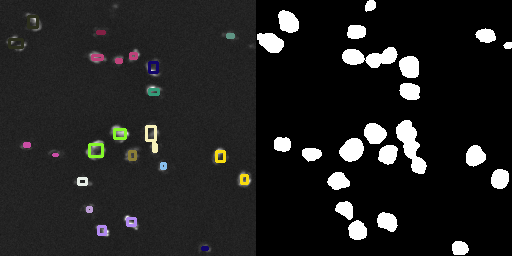

1/1 [==============================] - 0s 30ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_67.png


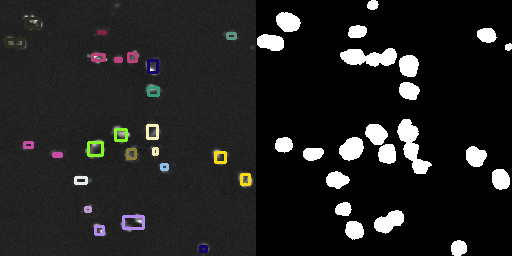

1/1 [==============================] - 0s 59ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_68.png


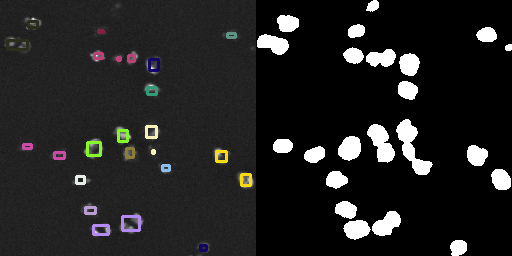

1/1 [==============================] - 0s 42ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_69.png


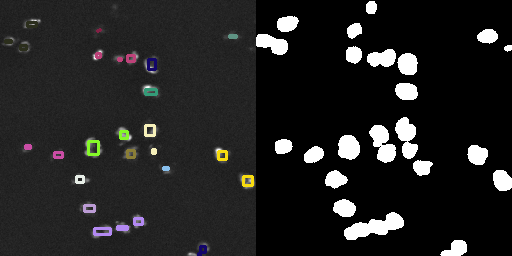

1/1 [==============================] - 0s 34ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_70.png


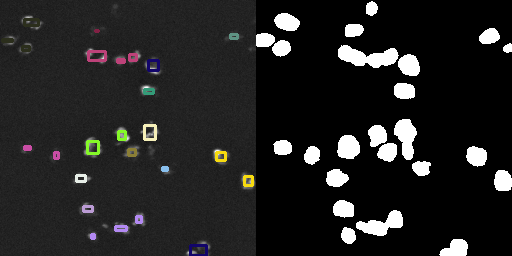

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_71.png


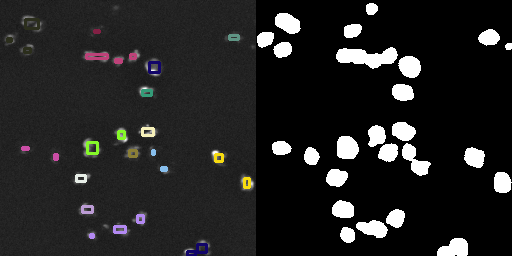

1/1 [==============================] - 0s 58ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_72.png


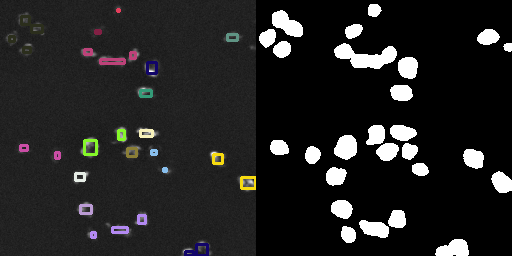

1/1 [==============================] - 0s 36ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_73.png


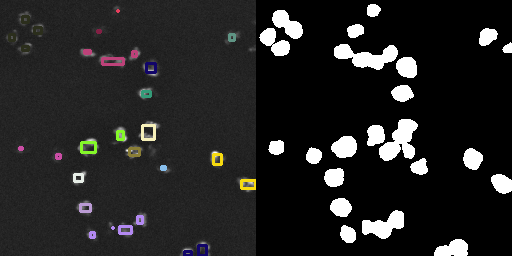

1/1 [==============================] - 0s 66ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_74.png


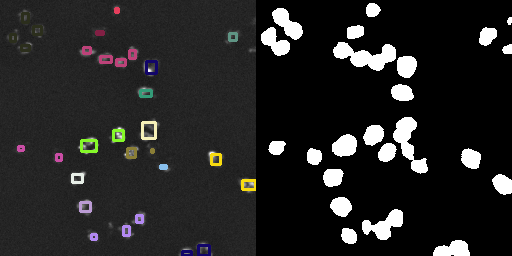

1/1 [==============================] - 0s 53ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_75.png


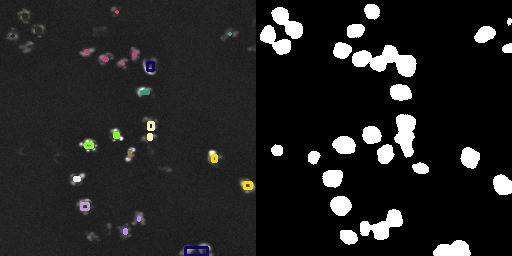

1/1 [==============================] - 0s 33ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_76.png


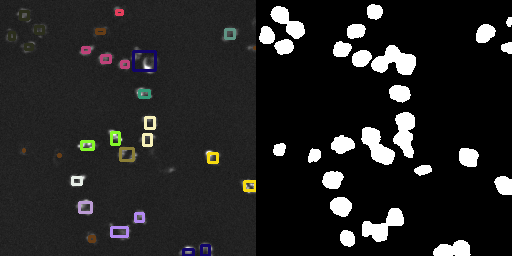

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_77.png


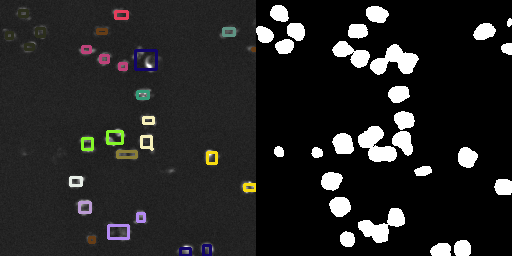

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_78.png


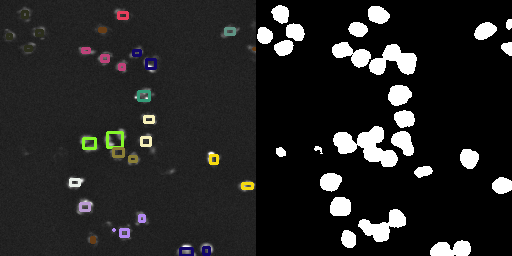

1/1 [==============================] - 0s 41ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_79.png


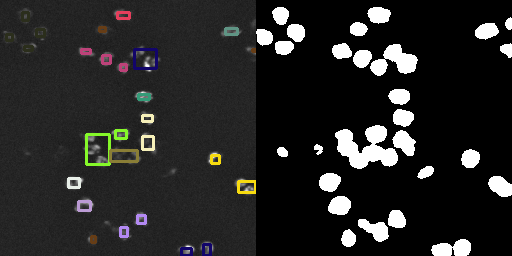

1/1 [==============================] - 0s 38ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_80.png


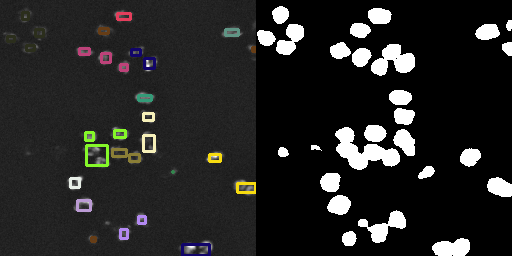

1/1 [==============================] - 0s 37ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_81.png


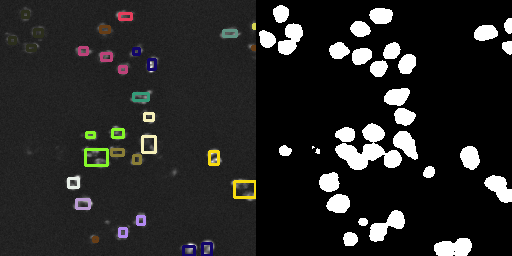

1/1 [==============================] - 0s 37ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_82.png


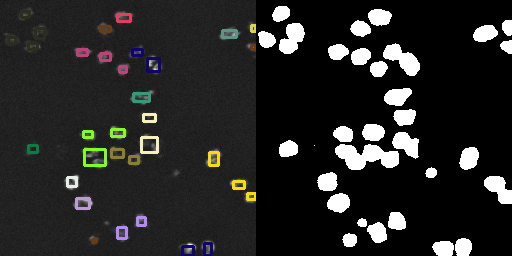

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_83.png


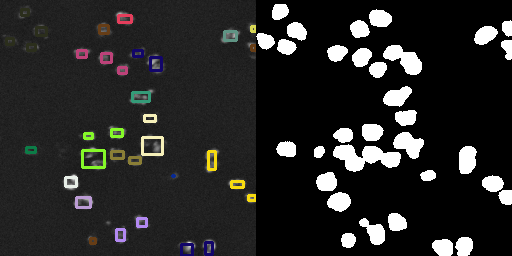

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_84.png


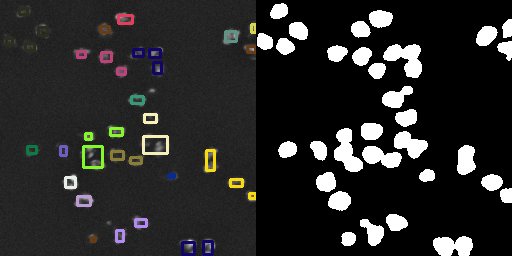

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_85.png


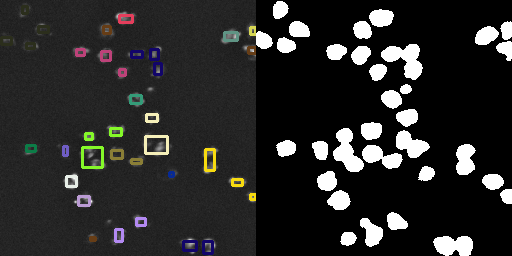

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_86.png


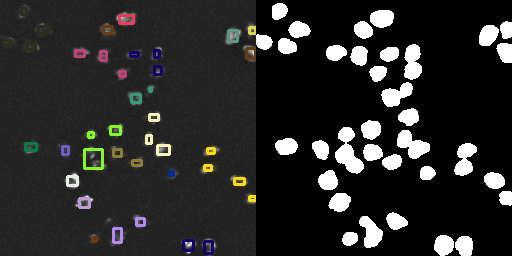

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_87.png


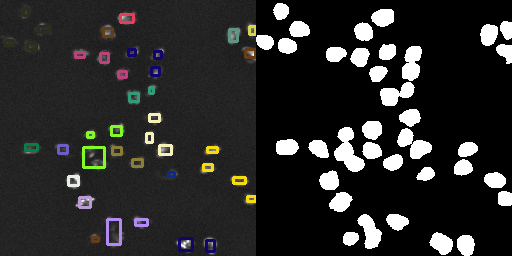

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_88.png


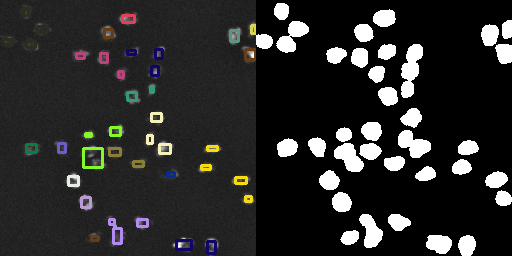

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_89.png


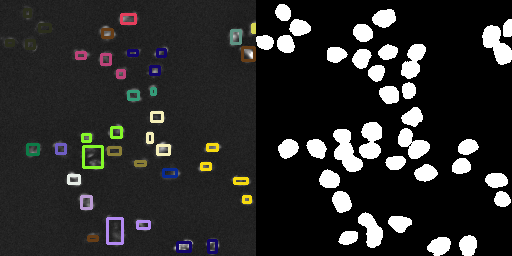

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_90.png


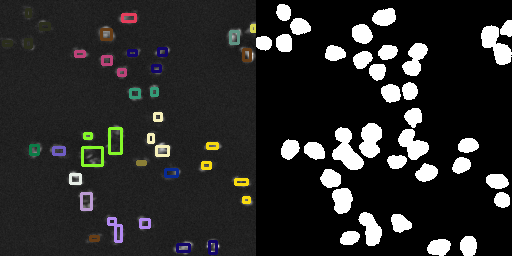

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_91.png


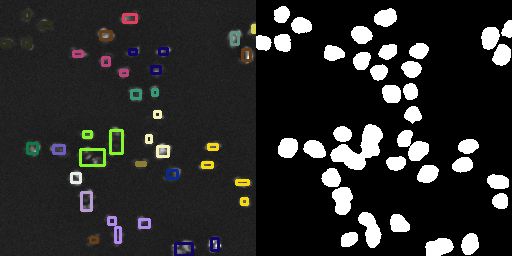

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_92.png


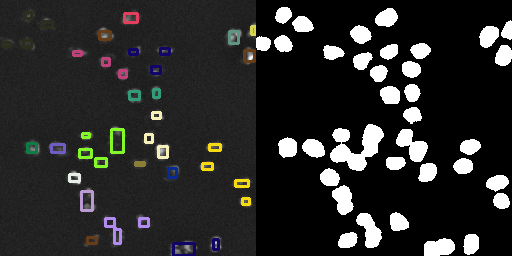

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_93.png


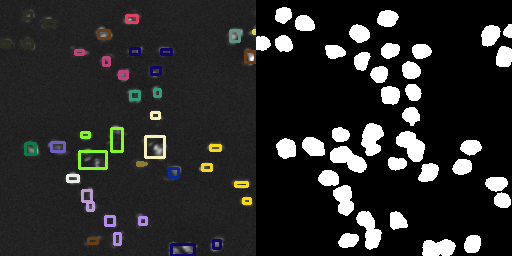

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_94.png


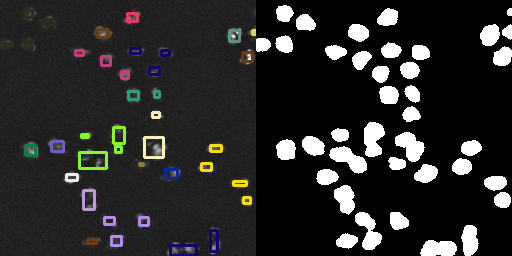

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_95.png


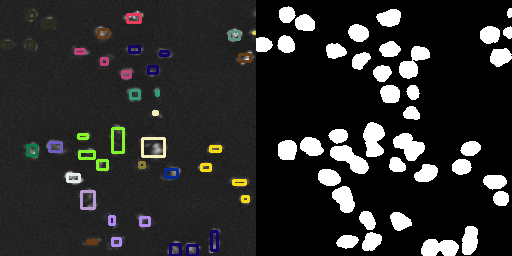

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_96.png


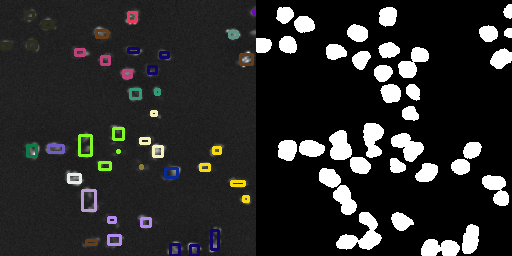

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_97.png


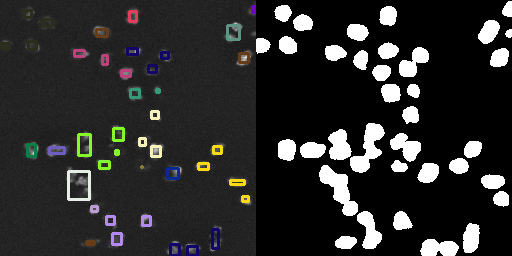

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_98.png


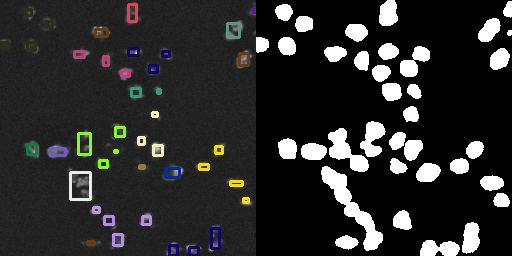

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_99.png


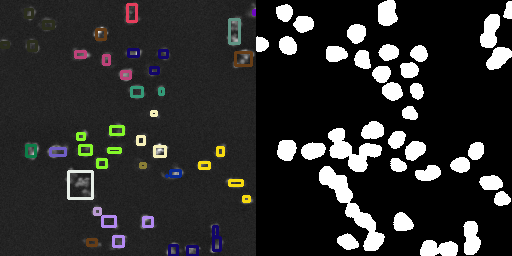

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_100.png


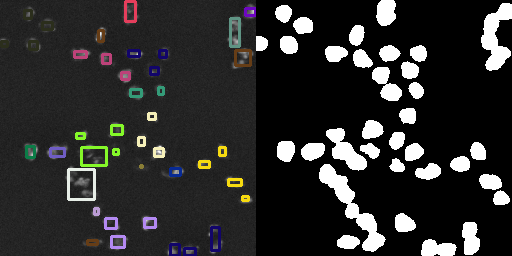

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_101.png


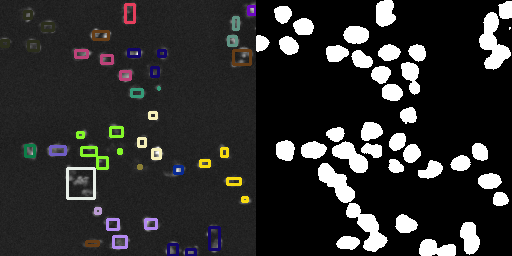

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_102.png


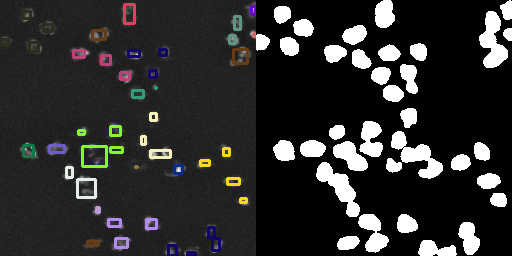

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_103.png


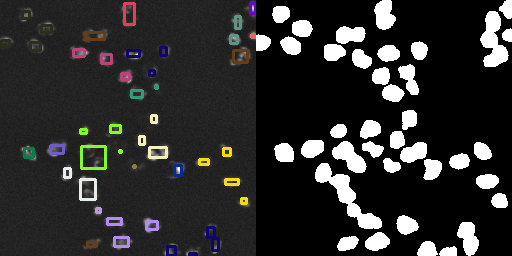

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_104.png


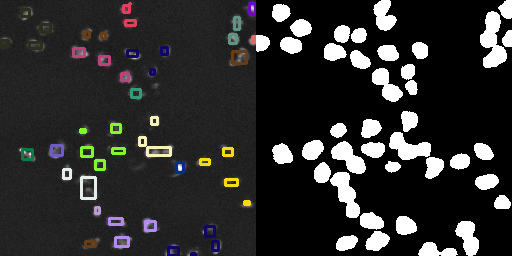

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_105.png


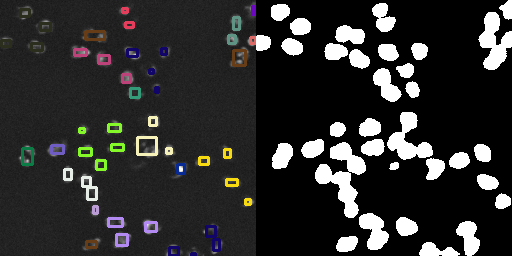

1/1 [==============================] - 0s 32ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_106.png


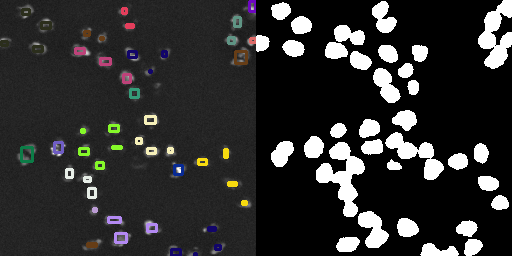

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_107.png


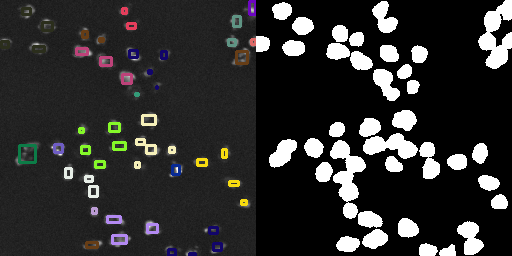

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_108.png


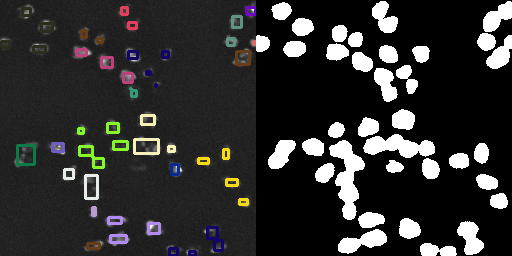

1/1 [==============================] - 0s 37ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_109.png


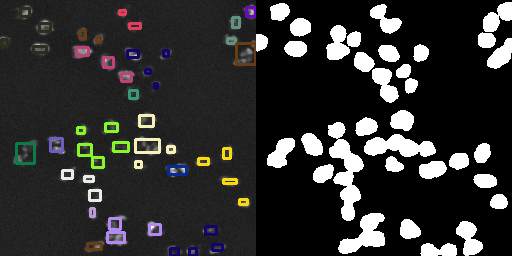

1/1 [==============================] - 0s 32ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_110.png


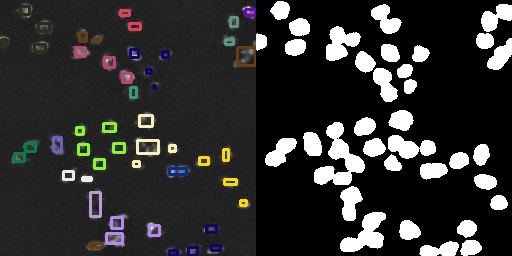

1/1 [==============================] - 0s 32ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_111.png


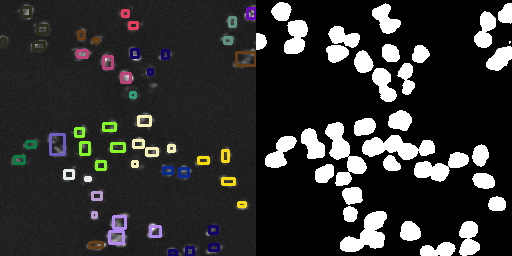

1/1 [==============================] - 0s 42ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_112.png


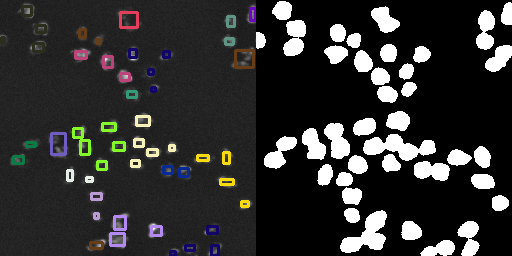

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_113.png


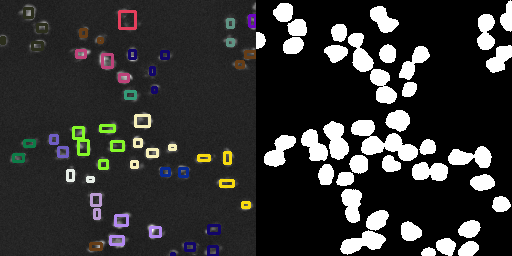

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_114.png


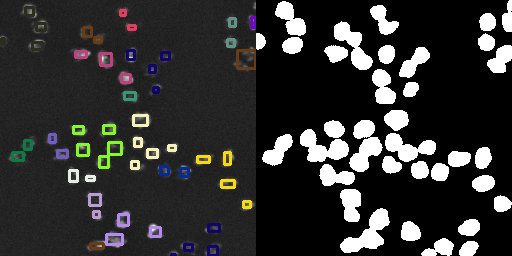

1/1 [==============================] - 0s 51ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_115.png


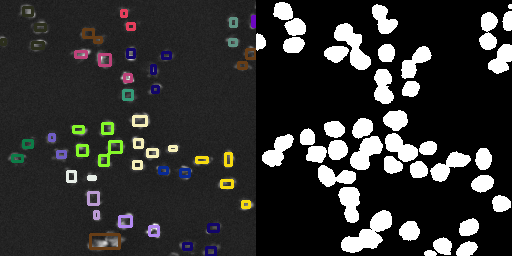

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_116.png


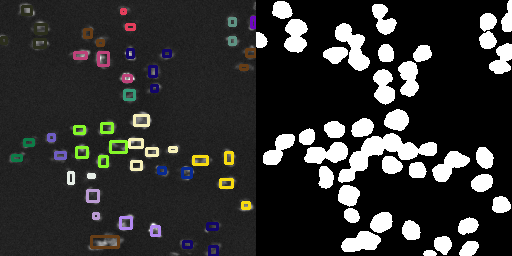

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_117.png


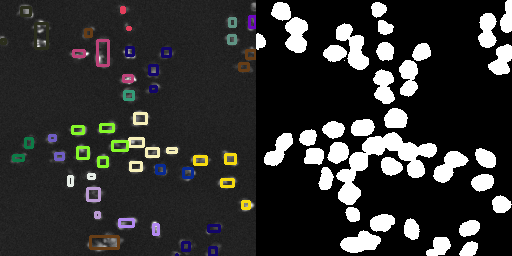

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_118.png


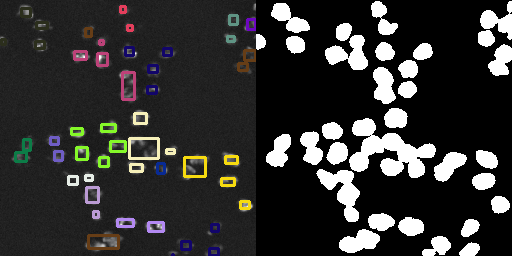

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_119.png


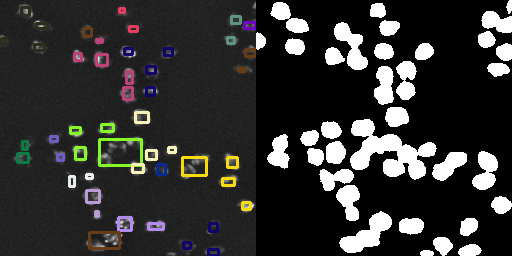

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_120.png


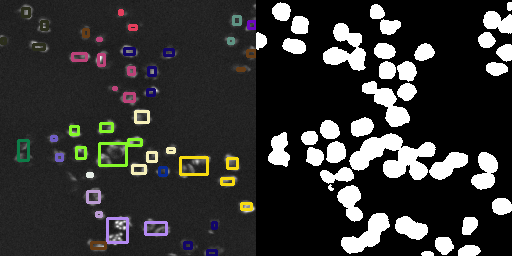

1/1 [==============================] - 0s 52ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_121.png


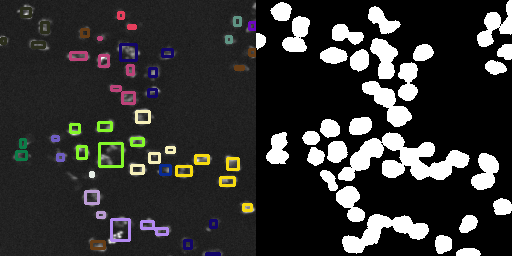

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_122.png


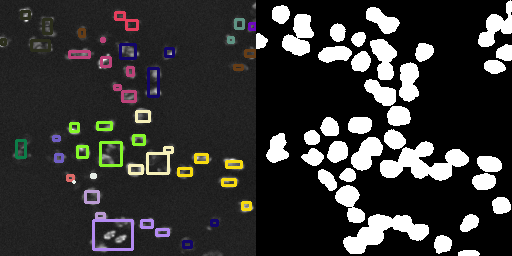

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_123.png


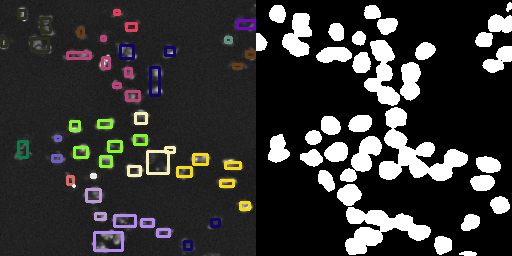

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_124.png


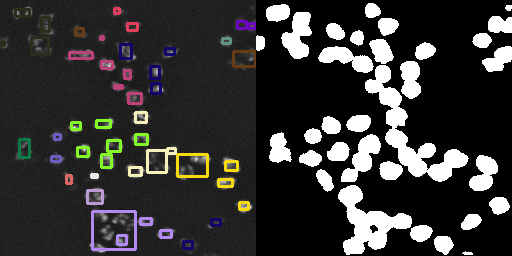

1/1 [==============================] - 0s 34ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_125.png


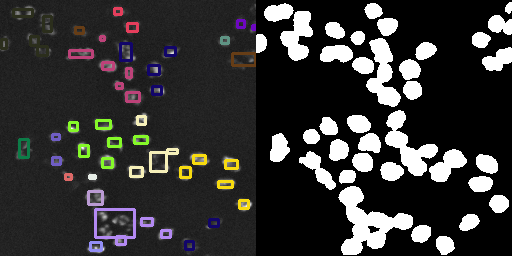

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_126.png


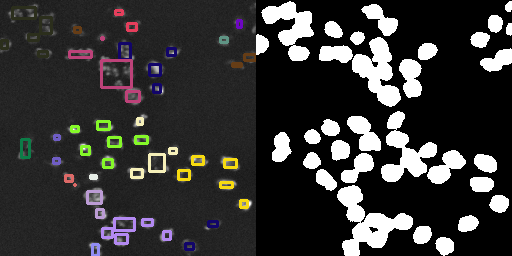

1/1 [==============================] - 0s 46ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_127.png


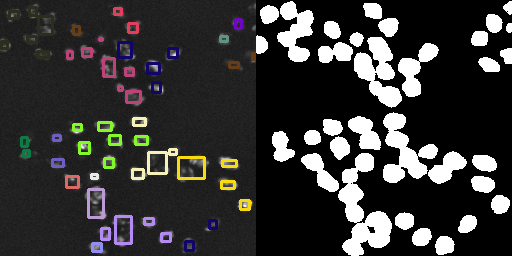

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_128.png


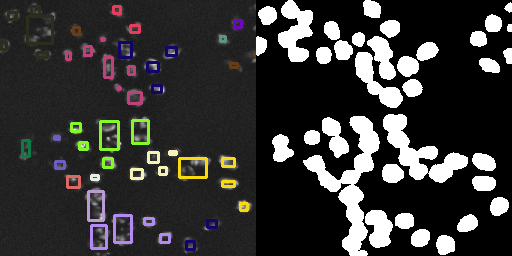

1/1 [==============================] - 0s 29ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_129.png


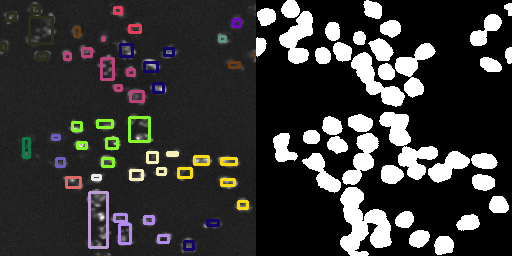

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_130.png


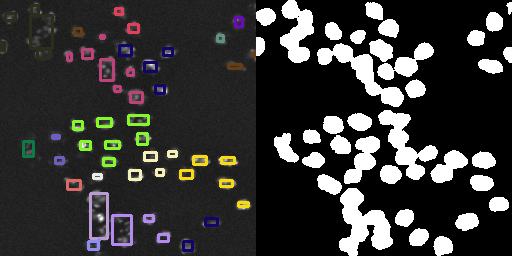

1/1 [==============================] - 0s 26ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_131.png


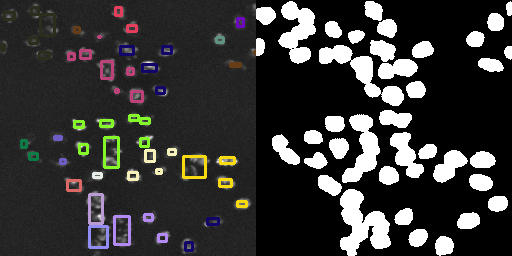

1/1 [==============================] - 0s 27ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_132.png


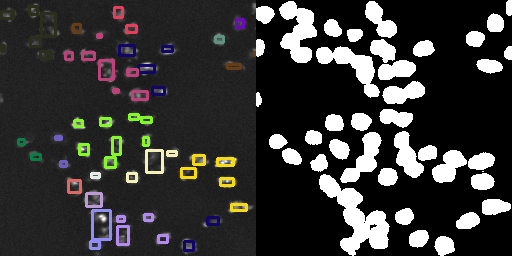

1/1 [==============================] - 0s 45ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_133.png


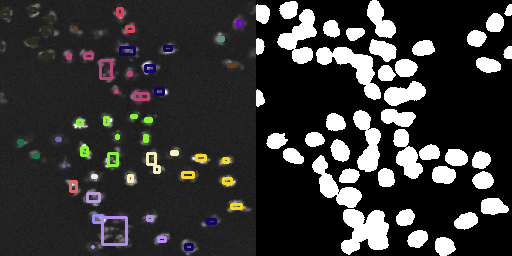

1/1 [==============================] - 0s 37ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_134.png


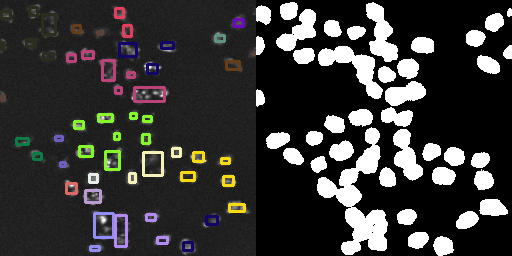

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_135.png


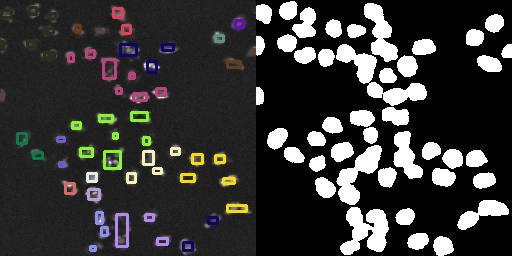

1/1 [==============================] - 0s 28ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_136.png


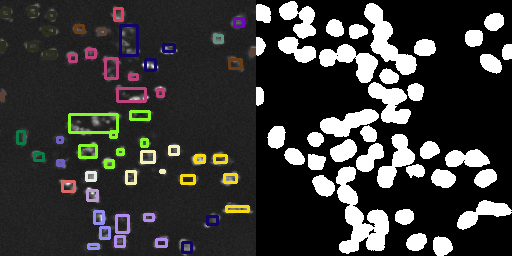

1/1 [==============================] - 0s 31ms/step
Image saved successfully at /content/drive/MyDrive/Master 2/BioMedical/result/sequence02/processed_image_137.png


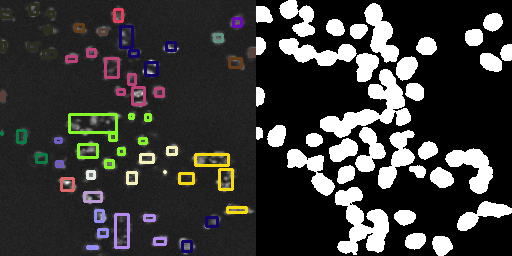

138
Vidéo enregistrée sous : /content/drive/MyDrive/Master 2/BioMedical/result/output_sequence02.mp4


In [ ]:
sequence_dir="/content/drive/MyDrive/Master 2/BioMedical/Test/02"
save_dir="/content/drive/MyDrive/Master 2/BioMedical/result/sequence02"
process_sequence(sequence_dir, unet_model,save_dir)
image_folder = '/content/drive/MyDrive/Master 2/BioMedical/result/sequence02'
video_path = '/content/drive/MyDrive/Master 2/BioMedical/result/output_sequence02.mp4'

create_video_from_images(image_folder, video_path, fps=15)

##Segmentation d'instance

In [ ]:
import cv2
import glob
from PIL import Image

# Chemin vers le dossier contenant les fichiers TIFF
folder_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/seg/sequence1'
# Sortie de la vidéo
video_name = '/content/drive/MyDrive/Master 2/BioMedical/video_seg_output.avi'

# Collecter les noms de fichiers TIFF
tiff_files = sorted(glob.glob(f"{folder_path}/*.tif"))

# Lire le premier fichier pour obtenir la taille de l'image
img = Image.open(tiff_files[0])
frame_size = img.size
img.close()

# Créer un objet VideoWriter
out = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'DIVX'), 10, frame_size)

# Lire chaque fichier TIFF et l'ajouter à la vidéo
for tiff_file in tiff_files:
    print(tiff_file[len(tiff_file)-len("man_seg000.tif"):len(tiff_file)])
    img = Image.open(tiff_file)
    img = img.convert('RGB')
    frame = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    out.write(frame)
    img.close()

# Libérer l'objet VideoWriter
out.release()


man_seg000.tif
man_seg001.tif
man_seg002.tif
man_seg003.tif
man_seg004.tif
man_seg005.tif
man_seg006.tif
man_seg007.tif
man_seg008.tif
man_seg009.tif
man_seg010.tif
man_seg011.tif
man_seg012.tif
man_seg013.tif
man_seg014.tif
man_seg015.tif
man_seg016.tif
man_seg017.tif
man_seg018.tif
man_seg019.tif
man_seg020.tif
man_seg021.tif
man_seg022.tif
man_seg023.tif
man_seg024.tif
man_seg025.tif
man_seg026.tif
man_seg027.tif
man_seg028.tif
man_seg029.tif
man_seg030.tif
man_seg031.tif
man_seg032.tif
man_seg033.tif
man_seg034.tif
man_seg035.tif
man_seg036.tif
man_seg037.tif
man_seg038.tif
man_seg039.tif
man_seg040.tif
man_seg041.tif
man_seg042.tif
man_seg043.tif
man_seg044.tif
man_seg045.tif
man_seg046.tif
man_seg047.tif
man_seg048.tif
man_seg049.tif
man_seg050.tif
man_seg051.tif
man_seg052.tif
man_seg053.tif
man_seg054.tif
man_seg055.tif
man_seg056.tif
man_seg057.tif
man_seg058.tif
man_seg059.tif
man_seg060.tif
man_seg061.tif
man_seg062.tif
man_seg063.tif
man_seg064.tif


In [ ]:
from skimage.measure import label, regionprops
import numpy as np
import os
from PIL import Image
from skimage.transform import resize
from skimage import exposure

def load_images_and_instance_masks(base_dir, target_size=(256, 256)):
    images_dir = os.path.join(base_dir, 'images')
    masks_dir = os.path.join(base_dir, 'seg')
    data = []

    for sequence in os.listdir(images_dir):
        sequence_images_dir = os.path.join(images_dir, sequence)
        sequence_masks_dir = os.path.join(masks_dir, sequence)

        for image_file in sorted(os.listdir(sequence_images_dir)):
            if image_file.endswith('.tif') or image_file.endswith('.tiff'):
                image_number = image_file.split('t')[1].split('.')[0]
                mask_file = f"man_seg{image_number}.tif"

                image_path = os.path.join(sequence_images_dir, image_file)
                mask_path = os.path.join(sequence_masks_dir, mask_file)

                if os.path.exists(mask_path):
                    # Charger l'image en niveaux de gris et la normaliser
                    image = Image.open(image_path).convert('L')
                    image = np.array(image) / 255.0
                    image = exposure.equalize_adapthist(image)
                    image_resized = resize(image, target_size, anti_aliasing=True)
                    image_with_channel = np.expand_dims(image_resized, axis=-1)
                    print(image_path)
                    # Charger et préparer le masque pour la segmentation d'instance
                    mask = Image.open(mask_path).convert('L')
                    mask = np.array(mask)
                    mask = resize(mask, target_size, order=0, preserve_range=True, anti_aliasing=False)
                    mask_label = label(mask)  # Étiquetage des instances
                    #print(mask_label)
                    instances = []
                    for region in regionprops(mask_label):
                        # Créer un masque binaire pour chaque instance
                        instance_mask = (mask_label == region.label).astype(np.float32)

                        # Calculer la boîte englobante
                        minr, minc, maxr, maxc = region.bbox
                        bbox = [minr, minc, maxr, maxc]

                        instances.append((instance_mask, bbox))

                    data.append((image_with_channel, instances))
                else:
                    print(f"Mask not found for {image_path}")

    return data

# Exemple d'utilisation
dataset_path = '/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data'
dataset = load_images_and_instance_masks(dataset_path)


/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t000.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t001.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t002.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t003.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t004.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t005.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t006.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t007.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t008.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t009.tif
/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data/images/sequence1/t010.tif
/content/drive/MyDrive/Master 2/BioMedical/

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def show_image_and_masks(image_with_channel, instances):
    # Extraire l'image
    image = image_with_channel.squeeze()

    # Créer une figure et un axe
    fig, ax = plt.subplots(1)
    ax.imshow(image, cmap='gray')

    # Parcourir chaque instance et dessiner la boîte englobante
    for instance_mask, bbox in instances:
        # Dessiner le rectangle de la boîte englobante
        rect = patches.Rectangle((bbox[1], bbox[0]), bbox[3] - bbox[1], bbox[2] - bbox[0], linewidth=1, edgecolor='r', facecolor='none')

        ax.add_patch(rect)

        # Afficher le masque d'instance
        ax.imshow(instance_mask, alpha=0.3, cmap='gray')

    plt.show()

# Afficher une image et ses masques d'instance
for index, (image_with_channel, instances) in enumerate(dataset):
    show_image_and_masks(image_with_channel, instances)

In [ ]:
from detectron2.structures import BoxMode
import numpy as np
import os
from PIL import Image
from skimage import exposure, measure, transform

def load_images_for_detectron2(base_dir, target_size=(256, 256)):
    dataset_dicts = []
    images_base_dir = os.path.join(base_dir, 'images')
    masks_base_dir = os.path.join(base_dir, 'seg')

    gray_to_class_id = {}
    next_class_id = 0
    gray_values = set()
    for sequence in sorted(os.listdir(images_base_dir)):
        images_dir = os.path.join(images_base_dir, sequence)
        masks_dir = os.path.join(masks_base_dir, sequence)

        for idx, image_file in enumerate(sorted(os.listdir(images_dir))):
            if image_file.endswith('.tif') or image_file.endswith('.tiff'):
                image_path = os.path.join(images_dir, image_file)
                mask_file_name = 'man_seg' + image_file.split('t')[1] + 'tif'  # Assurez-vous que c'est le format correct
                mask_path = os.path.join(masks_dir, mask_file_name)

                if os.path.exists(mask_path):
                    try:
                        image = Image.open(image_path).convert('L')
                        image = np.array(image) / 255.0
                        image = exposure.equalize_adapthist(image)
                        image_resized = transform.resize(image, target_size, anti_aliasing=True)
                        height, width = image_resized.shape

                        record = {
                            "file_name": image_path,
                            "image_id": idx,
                            "height": height,
                            "width": width,
                            "mask_file_name": mask_path
                        }

                        mask = Image.open(mask_path).convert('L')
                        mask = np.array(mask)
                        unique_grays = np.unique(mask)
                        gray_values.update(unique_grays)
                        for gray_value in unique_grays:
                            if gray_value not in gray_to_class_id:
                                gray_to_class_id[gray_value] = next_class_id
                                next_class_id += 1

                        mask_label = measure.label(mask, background=0)
                        objs = []

                        for region in measure.regionprops(mask_label):
                            if region.area < 50:  # Exclure les petites régions
                                continue
                            minr, minc, maxr, maxc = region.bbox
                            bbox = [minc, minr, maxc, maxr]
                            instance_mask = (mask_label == region.label).astype(np.uint8)
                            contours = measure.find_contours(instance_mask, 0.5)
                            poly = [contour.flatten().tolist() for contour in contours]

                            class_id = gray_to_class_id[mask[region.coords[0][0], region.coords[0][1]]]

                            obj = {
                                "bbox": bbox,
                                "bbox_mode": BoxMode.XYXY_ABS,
                                "segmentation": poly,
                                "category_id": class_id,
                            }
                            objs.append(obj)

                        record["annotations"] = objs
                        dataset_dicts.append(record)

                    except IOError as e:
                        print(f"Erreur lors de l'ouverture de l'image {image_path}: {e}")

    return dataset_dicts, gray_values



In [ ]:
dataset_dicts, gray_values = load_images_for_detectron2('/content/drive/MyDrive/Master 2/BioMedical/Segmentation_Data')

In [ ]:
!pip show imagecodecs


Name: imagecodecs
Version: 2024.1.1
Summary: Image transformation, compression, and decompression codecs
Home-page: https://www.cgohlke.com
Author: Christoph Gohlke
Author-email: cgohlke@cgohlke.com
License: BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy
Required-by: 


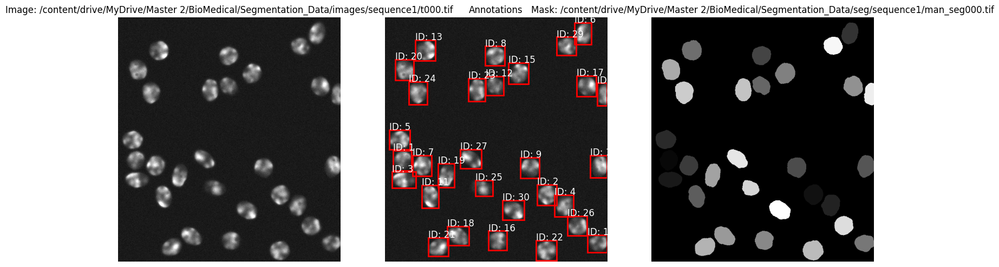

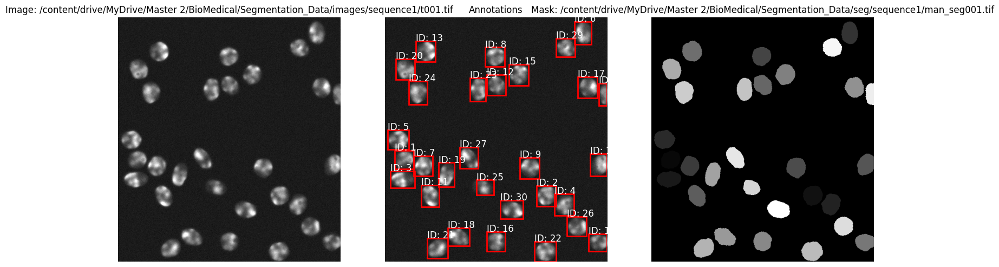

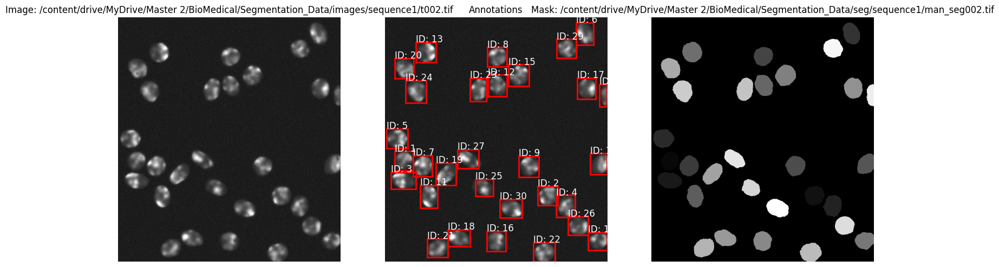

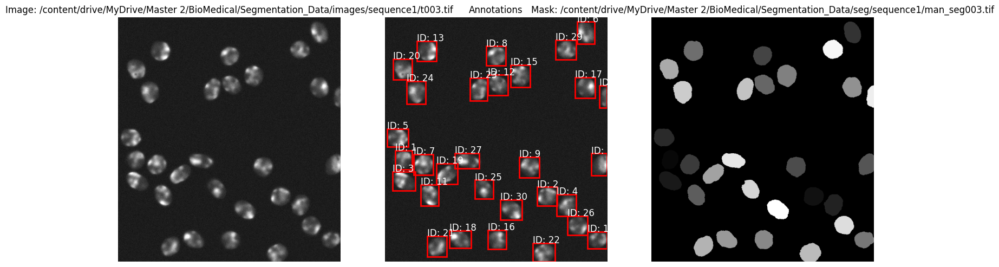

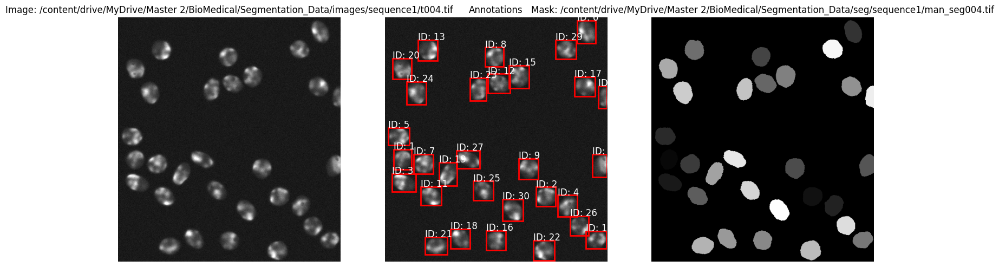

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

def display_image_data(dataset_dict, num_samples=5):
    for idx, record in enumerate(dataset_dict[:num_samples]):
        # Load and display image
        image_path = record['file_name']
        mask_path = record['mask_file_name']

        image = Image.open(image_path).convert('L')
        mask = Image.open(mask_path).convert('L') if mask_path else None

        plt.figure(figsize=(18, 6))

        # Display original image
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f"Image: {image_path}")
        plt.axis('off')

        # Draw bounding boxes and display annotations
        ax = plt.subplot(1, 3, 2)
        plt.imshow(image, cmap='gray')
        for anno in record['annotations']:
            bbox = anno['bbox']
            rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(bbox[0], bbox[1], f"ID: {anno['category_id']}", color='white', fontsize=12)
        plt.title(f"Annotations")
        plt.axis('off')

        # Display mask
        if mask:
            plt.subplot(1, 3, 3)
            plt.imshow(mask, cmap='gray')
            plt.title(f"Mask: {mask_path}")
            plt.axis('off')

        plt.show()

# Utilisation de la fonction
display_image_data(dataset_dicts)


In [ ]:
import random
random.shuffle(dataset_dicts)

train_size = int(0.8 * len(dataset_dicts))
val_size = int(0.10 * len(dataset_dicts))
test_size = len(dataset_dicts) - train_size - val_size

train_dataset_dicts = dataset_dicts[:train_size]
val_dataset_dicts = dataset_dicts[train_size:train_size + val_size]
test_dataset_dicts = dataset_dicts[train_size + val_size:]

print(f"Train set size: {len(train_dataset_dicts)}")
print(f"Validation set size: {len(val_dataset_dicts)}")
print(f"Test set size: {len(test_dataset_dicts)}")

Train set size: 172
Validation set size: 21
Test set size: 22


In [ ]:
thing_classes = [f"class_{g}" for g in sorted(list(gray_values))]

In [ ]:
print(thing_classes)

['class_0', 'class_1', 'class_2', 'class_3', 'class_4', 'class_5', 'class_6', 'class_7', 'class_8', 'class_9', 'class_10', 'class_11', 'class_12', 'class_13', 'class_14', 'class_15', 'class_16', 'class_17', 'class_18', 'class_19', 'class_20', 'class_21', 'class_22', 'class_23', 'class_24', 'class_25', 'class_26', 'class_27', 'class_28', 'class_29', 'class_30', 'class_31', 'class_32', 'class_33', 'class_34', 'class_35', 'class_36', 'class_37', 'class_38', 'class_39', 'class_40', 'class_41', 'class_42', 'class_43', 'class_44', 'class_45', 'class_46', 'class_47', 'class_48', 'class_49', 'class_50', 'class_51', 'class_52', 'class_53', 'class_54', 'class_55', 'class_56', 'class_57', 'class_58', 'class_59', 'class_60', 'class_61', 'class_62', 'class_63', 'class_64', 'class_65', 'class_66', 'class_67', 'class_68', 'class_69', 'class_70', 'class_71', 'class_72', 'class_73', 'class_74', 'class_75', 'class_76', 'class_77', 'class_78', 'class_79', 'class_80', 'class_81', 'class_82', 'class_83', '